In [1]:
import numpy as np
import scipy
import scipy.io as sio
import cv2 as cv 
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
from scipy.ndimage import label
import matplotlib.patches as patches

# Μέρος 1

## 1.1

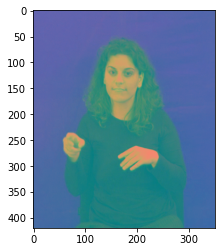

In [2]:
I = cv.imread("part1 - GreekSignLanguage/3.png",cv.IMREAD_COLOR)
I = cv.cvtColor(I,cv.COLOR_BGR2YCrCb)
plt.imshow(I)
I = I[:,:,1:]       # κρατάμε μόνο το Cr και το Cb

In [3]:
Table = sio.loadmat("part1 - GreekSignLanguage/skinSamplesRGB.mat")
Table = Table['skinSamplesRGB']
Table = cv.cvtColor(Table,cv.COLOR_RGB2YCrCb)
Table = Table[:,:,1:]
mCr = np.mean(Table[:,:,0])
mCb = np.mean(Table[:,:,1])
                                                # Υπολογίζουμε μέσο όρο και πίνακα συνδιακύμανσης από τα δεδομένα εκπαίδευσης
cov = np.cov(np.reshape(Table,(22*81,2)).T)

In [4]:
distribution = multivariate_normal([mCr, mCb], cov)                 #Διδιάστατη κανονική κατανομή με βάση Mean/Covariance αυτά που υπολογίσαμε παραπάνω
skin_dist = distribution.pdf(I)/np.max(distribution.pdf(I))

Text(0.5, 0, 'z')

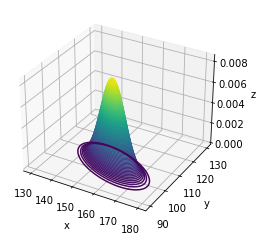

In [5]:
x = np.linspace(130, 180, 100)
y = np.linspace(90, 130, 100)
X, Y = np.meshgrid(x, y)
pos = np.dstack((X, Y))

Z = distribution.pdf(pos)

fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X, Y, Z, 100)
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

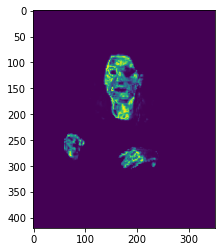

In [6]:
plt.imshow(skin_dist)

In [7]:
skin_regions = skin_dist >= 0.23

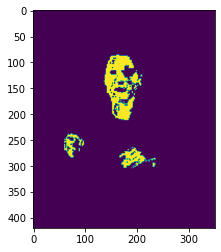

In [8]:
plt.imshow(skin_regions)

In [9]:
skin_regions = skin_regions.astype(np.uint8)
op = cv.morphologyEx(skin_regions, cv.MORPH_OPEN, np.ones((2,2), np.uint8))
op_clos = cv.morphologyEx(op, cv.MORPH_CLOSE, np.ones((12,12), np.uint8))

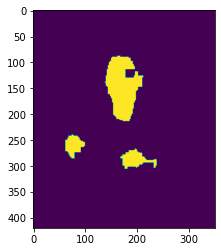

In [10]:
plt.imshow(op_clos)

In [11]:
labeled_img, num_items = label(op_clos)

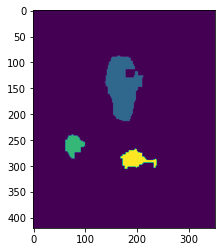

In [12]:
plt.imshow(labeled_img)

In [13]:
unique, counts = np.unique(labeled_img, return_counts=True)

print(unique)
print(counts)

[0 1 2 3]
[138704   5824   1092   1380]


In [14]:
tol = np.vstack([unique,counts])
tol = np.delete(tol, np.where(tol==0)[1], 1)
ind = np.argpartition(tol[1, :], -3)[-3:]           # Κρατάμε τα 3 μεγαλύτερα regions που εντοπίστηκαν πάνω στην εικόνα
ind

array([1, 0, 2], dtype=int64)

In [15]:
positions_1 = np.where(labeled_img == tol[0, ind[0]])
box_1 = (np.min(positions_1[1]), np.min(positions_1[0]), np.max(positions_1[1])-np.min(positions_1[1]), np.max(positions_1[0])-np.min(positions_1[0]))

positions_2 = np.where(labeled_img == tol[0, ind[1]])
box_2 = (np.min(positions_2[1]), np.min(positions_2[0]), np.max(positions_2[1])-np.min(positions_2[1]), np.max(positions_2[0])-np.min(positions_2[0]))

positions_3 = np.where(labeled_img == tol[0, ind[2]])
box_3 = (np.min(positions_3[1]), np.min(positions_3[0]), np.max(positions_3[1])-np.min(positions_3[1]), np.max(positions_3[0])-np.min(positions_3[0]))


In [16]:
def fd(I, mu, cov):
    I = cv.cvtColor(I,cv.COLOR_BGR2YCrCb)
    I = I[:,:,1:]
    
    distribution = multivariate_normal([mCr, mCb], cov)
    skin_dist = distribution.pdf(I)/np.max(distribution.pdf(I))
    
    skin_regions = skin_dist >= 0.23
    
    skin_regions = skin_regions.astype(np.uint8)
    op = cv.morphologyEx(skin_regions, cv.MORPH_OPEN, np.ones((4,4), np.uint8))
    op_clos = cv.morphologyEx(op, cv.MORPH_CLOSE, np.ones((10,10), np.uint8))
    
    labeled_img, num_items = label(op_clos)
    
    unique, counts = np.unique(labeled_img, return_counts=True)
    
    tol = np.vstack([unique,counts])
    tol = np.delete(tol, np.where(tol==0)[1], 1)
    ind = np.argpartition(tol[1, :], -3)[-3:]
    
    positions_1 = np.where(labeled_img == tol[0, ind[0]])
    box_1 = [np.min(positions_1[1]), np.min(positions_1[0]), np.max(positions_1[1])-np.min(positions_1[1]), np.max(positions_1[0])-np.min(positions_1[0])]

    positions_2 = np.where(labeled_img == tol[0, ind[1]])
    box_2 = [np.min(positions_2[1]), np.min(positions_2[0]), np.max(positions_2[1])-np.min(positions_2[1]), np.max(positions_2[0])-np.min(positions_2[0])]

    positions_3 = np.where(labeled_img == tol[0, ind[2]])
    box_3 = [np.min(positions_3[1]), np.min(positions_3[0]), np.max(positions_3[1])-np.min(positions_3[1]), np.max(positions_3[0])-np.min(positions_3[0])]

    return (box_1, box_2, box_3)

In [17]:
I = cv.imread("part1 - GreekSignLanguage/1.png",cv.IMREAD_COLOR)
box_1, box_2, box_3 = fd(I, [mCr, mCb], cov)
print(box_1)
print(box_2)
print(box_3)

[64, 260, 29, 37]
[174, 272, 41, 33]
[140, 92, 55, 121]


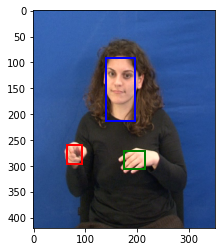

In [18]:
from PIL import Image

I = cv.imread("part1 - GreekSignLanguage/1.png",cv.IMREAD_COLOR)
box_1, box_2, box_3 = fd(I, [mCr, mCb], cov)

im = Image.open('part1 - GreekSignLanguage/1.png')

# Create figure and axes
fig, ax = plt.subplots()

# Display the image
ax.imshow(im)

# Create a Rectangle patch
rect1 = patches.Rectangle((box_1[0], box_1[1]), box_1[2], box_1[3], linewidth=2, edgecolor='r', facecolor='none')
rect2 = patches.Rectangle((box_2[0], box_2[1]), box_2[2], box_2[3], linewidth=2, edgecolor='g', facecolor='none')
rect3 = patches.Rectangle((box_3[0], box_3[1]), box_3[2], box_3[3], linewidth=2, edgecolor='b', facecolor='none')


# Add the patch to the Axes
ax.add_patch(rect1)
ax.add_patch(rect2)
ax.add_patch(rect3)

plt.show()

## 1.2.1

In [19]:
left_hand = [47, 243, 71, 66]
right_hand = [162, 264, 83, 48]
head_box = [138, 88, 73, 123]

In [20]:
I1 = cv.imread("part1 - GreekSignLanguage/1.png",cv.IMREAD_GRAYSCALE)
I2 = cv.imread("part1 - GreekSignLanguage/2.png",cv.IMREAD_GRAYSCALE)
I1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
I2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
I1 = I1/255
I2 = I2/255

In [21]:
def lk(I1, I2, features, rho, epsilon, dx_0, dy_0):
    
    sigma=rho
    n=int(np.ceil(3*sigma)*2+1)
    ker=cv.getGaussianKernel(n,sigma)
    gauss2D= ker @ ker.T
    
    dx_i = dx_0
    dy_i = dy_0
    
    for i in range(300): #Επανάληψη μέχρι σύγκλιση του υ
        x_0, y_0 = np.meshgrid(np.arange(I1.shape[1]),np.arange(I1.shape[0]))
        A2, A1 = np.gradient(I1)
        I1_t = scipy.ndimage.map_coordinates(I1,[y_0+dy_i, x_0+dx_i], order=1)
        A1 = scipy.ndimage.map_coordinates(A1,[y_0+dy_i, x_0+dx_i], order=1)
        A2 = scipy.ndimage.map_coordinates(A2,[y_0+dy_i, x_0+dx_i], order=1)
        E = I2 - I1_t

        TL = cv.filter2D(A1*A1, -1, gauss2D) + epsilon
        TR = cv.filter2D(A1*A2, -1, gauss2D)
        BL = TR
        BR = cv.filter2D(A2*A2, -1, gauss2D) + epsilon

        determinant = TL*BR - TR*BL

        TRR = cv.filter2D(A1*E, -1, gauss2D)
        BRR = cv.filter2D(A2*E, -1, gauss2D)

        u = [(TRR*BR-BRR*TR)/determinant,  (-TRR*BL+BRR*TL)/determinant] #Αναλυτικός Υπολογισμός του υ

        dx_i += u[0]
        dy_i += u[1]
        
        if (np.linalg.norm(u[0])<0.02 and np.linalg.norm(u[1])<0.02): #Σύγκριση κατά x και y 
            break
            
    d_x , d_y = dx_i[features[:,1]-1,features[:,0]-1],dy_i[features[:,1]-1,features[:,0]-1] #Επιλογή d των features
    
    
    return d_x, d_y    

(66, 71)

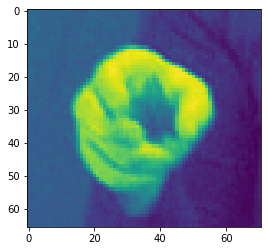

In [22]:
plt.imshow(I1)
I1.shape

In [23]:
I2 = I2.astype(np.float32)
features = cv.goodFeaturesToTrack(I2, maxCorners = 300, qualityLevel = 0.005, minDistance = 7)
features = features.reshape((features.shape[0],features.shape[2]))
features = features.astype(int)
d_x, d_y = lk(I1, I2, features, 2, 0.05, 3, 3)


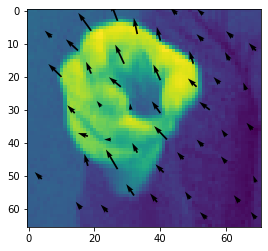

In [24]:
plt.figure()
plt.imshow(I2)
plt.quiver(features[:,0],features[:,1],-d_x,-d_y,angles='xy',scale=100)

## 1.2.2

In [25]:
def displ(d_x, d_y , threshold): #Συναρτήση ολικού διανύσματος μετατόπισης bounding box
    mask = (d_x**2 + d_y**2) >= threshold*np.max(d_x**2 + d_y**2)
    displ_x = d_x[mask]
    displ_y = d_y[mask]
    
    d_xmean = np.mean(displ_x)
    d_ymean = np.mean(displ_y)
    
    return d_xmean,d_ymean

In [26]:
def get_features(I1,corners,qL,minDist): #Συνάρτηση για εξαγωγή features για χρήση
    I1 = I1.astype(np.float32)
    features = cv.goodFeaturesToTrack(I1, maxCorners = corners, qualityLevel = qL, minDistance = minDist)
    features = features.reshape((features.shape[0],features.shape[2]))
    features = features.astype(int)
    return features

 Δοκιμάζουμε διάφορες τιμές για rho, epsilon.

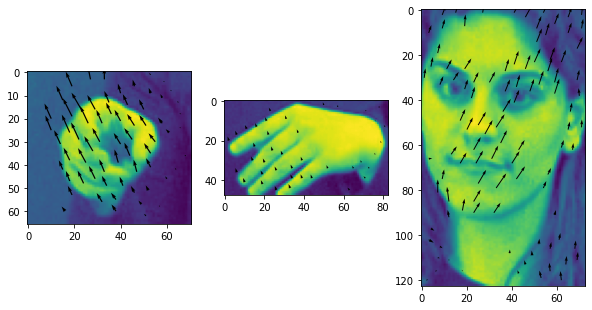

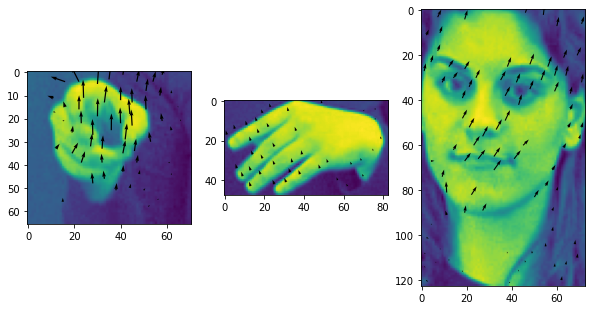

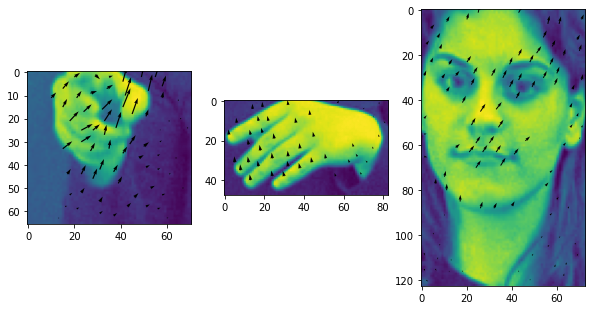

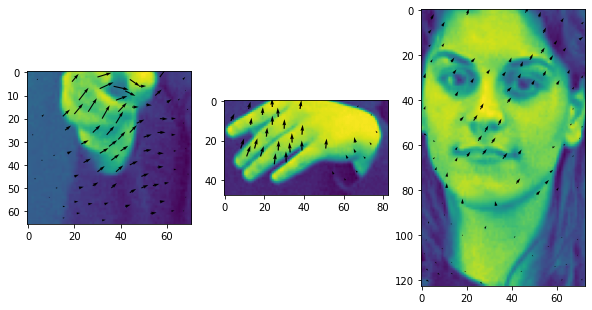

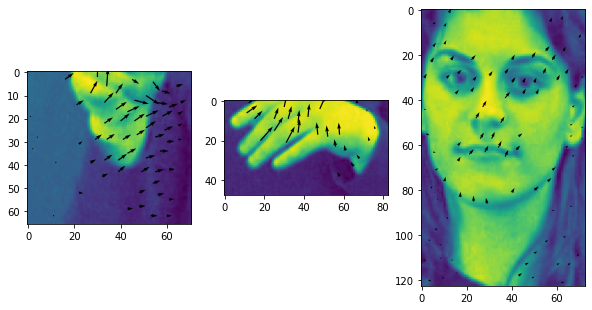

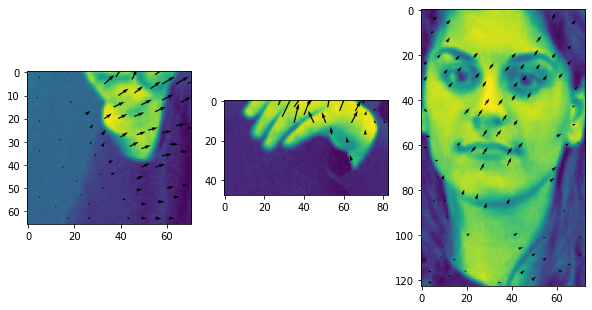

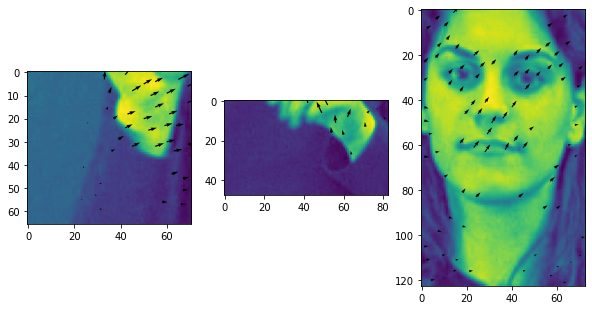

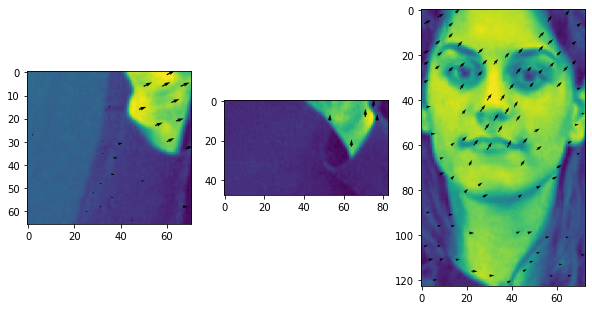

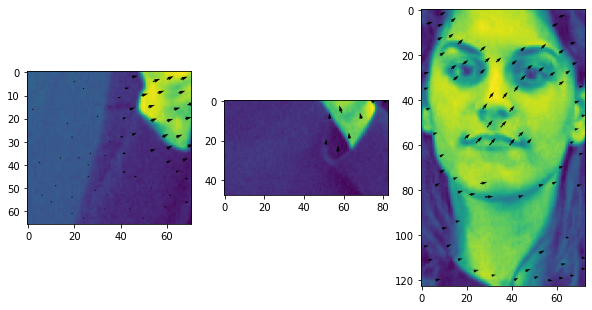

In [40]:
left_hand = [47, 243, 71, 66]
right_hand = [162, 264, 83, 48]
head_box = [138, 88, 73, 123]
#Εκτέλεση Lucas-Kanade για μερικές εικόνες και τα bounding box της καθεμίας
for i in range(1, 10):
    I1 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i),cv.IMREAD_GRAYSCALE)
    I2 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i+1),cv.IMREAD_GRAYSCALE)
    
    L1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L1 = L1/255
    L2 = L2/255
    
    R1 = I1[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R2 = I2[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R1 = R1/255
    R2 = R2/255
    
    H1 = I1[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H2 = I2[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H1 = H1/255
    H2 = H2/255
    
    L_features = get_features(L2, 100, 0.01, 5)
    R_features = get_features(R2, 100, 0.01, 5)
    H_features = get_features(H2, 100, 0.01, 5)
    
    Ld_x,Ld_y = lk(L1, L2, L_features, 8, 0.005, 0, 0)
    Rd_x,Rd_y = lk(R1, R2, R_features, 8, 0.005, 0, 0)
    Hd_x,Hd_y = lk(H1, H2, H_features, 8, 0.005, 0, 0)
    
    Ldx_f,Ldy_f = displ(Ld_x,Ld_y,0.5)
    Rdx_f,Rdy_f = displ(Rd_x,Rd_y,0.5)
    Hdx_f,Hdy_f = displ(Hd_x,Hd_y,0.5)
    
    fig , ax = plt.subplots(1,3, figsize=(10,7))
    
    ax[0].imshow(L1)
    ax[0].quiver(L_features[:,0],L_features[:,1],-Ld_x,-Ld_y,angles='xy',scale=100)
    
    ax[1].imshow(R1)
    ax[1].quiver(R_features[:,0],R_features[:,1],-Rd_x,-Rd_y,angles='xy',scale=100)
    
    ax[2].imshow(H1)
    ax[2].quiver(H_features[:,0],H_features[:,1],-Hd_x,-Hd_y,angles='xy',scale=30)

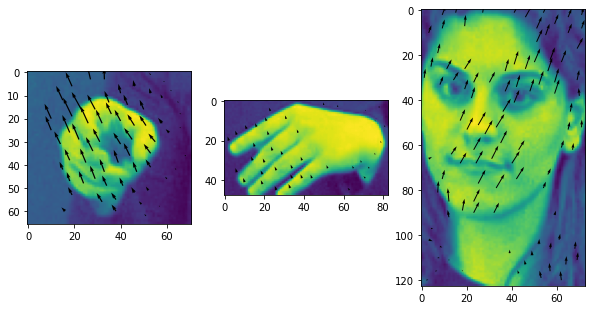

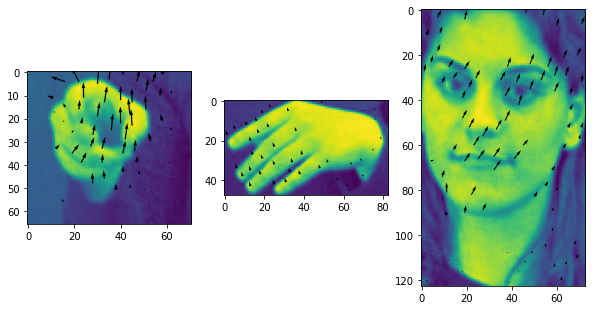

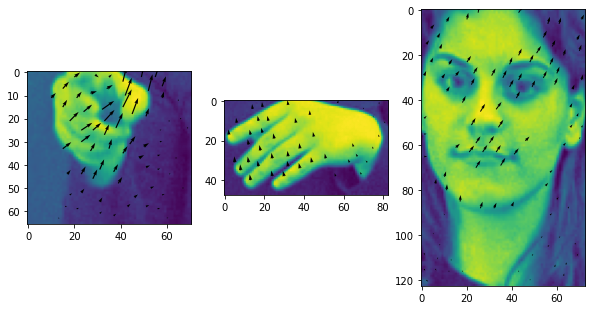

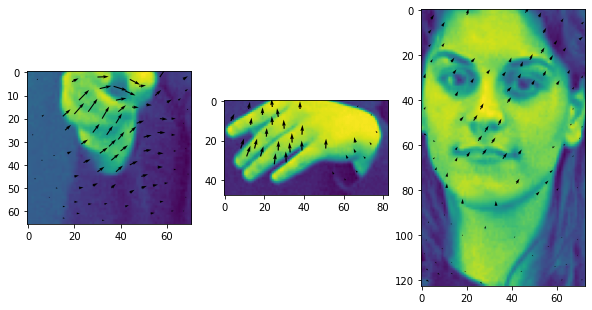

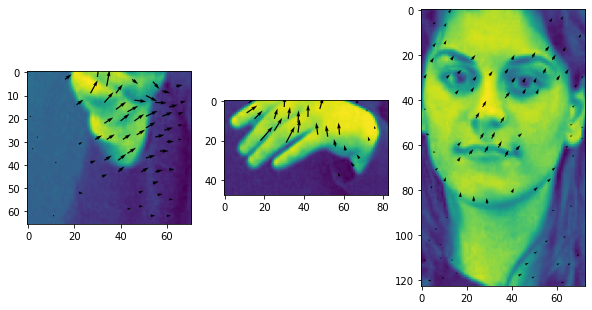

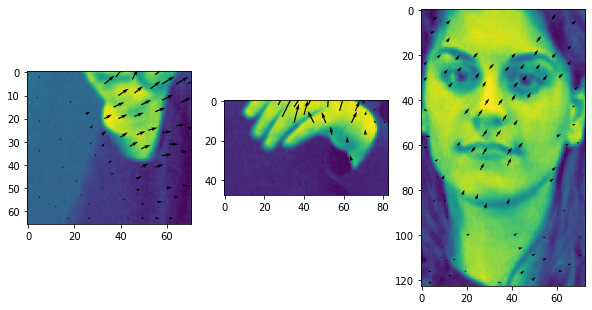

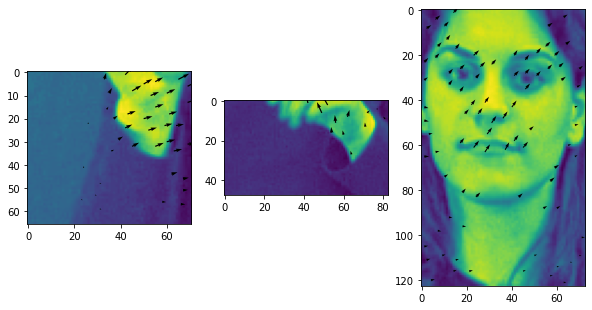

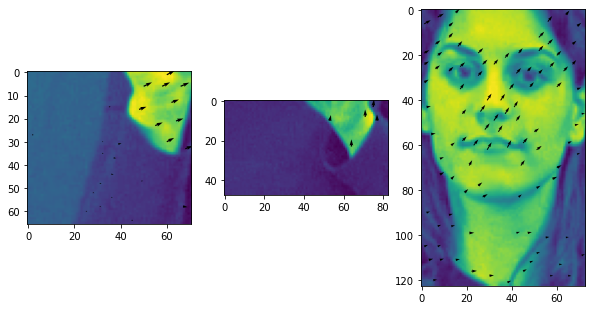

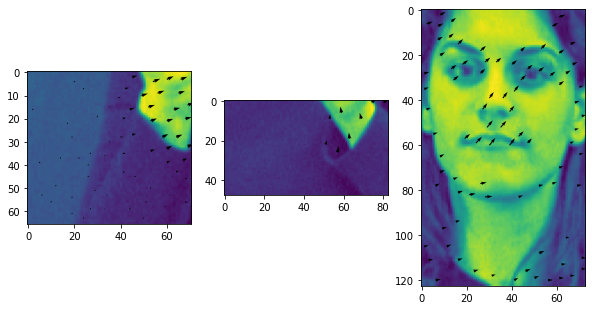

In [41]:
left_hand = [47, 243, 71, 66]
right_hand = [162, 264, 83, 48]
head_box = [138, 88, 73, 123]
#Εκτέλεση Lucas-Kanade για μερικές εικόνες και τα bounding box της καθεμίας
for i in range(1, 10):
    I1 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i),cv.IMREAD_GRAYSCALE)
    I2 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i+1),cv.IMREAD_GRAYSCALE)
    
    L1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L1 = L1/255
    L2 = L2/255
    
    R1 = I1[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R2 = I2[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R1 = R1/255
    R2 = R2/255
    
    H1 = I1[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H2 = I2[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H1 = H1/255
    H2 = H2/255
    
    L_features = get_features(L2, 100, 0.01, 5)
    R_features = get_features(R2, 100, 0.01, 5)
    H_features = get_features(H2, 100, 0.01, 5)
    
    Ld_x,Ld_y = lk(L1, L2, L_features, 8, 0.01, 0, 0)
    Rd_x,Rd_y = lk(R1, R2, R_features, 8, 0.01, 0, 0)
    Hd_x,Hd_y = lk(H1, H2, H_features, 8, 0.01, 0, 0)
    
    Ldx_f,Ldy_f = displ(Ld_x,Ld_y,0.5)
    Rdx_f,Rdy_f = displ(Rd_x,Rd_y,0.5)
    Hdx_f,Hdy_f = displ(Hd_x,Hd_y,0.5)
    
    fig , ax = plt.subplots(1,3, figsize=(10,7))
    
    ax[0].imshow(L1)
    ax[0].quiver(L_features[:,0],L_features[:,1],-Ld_x,-Ld_y,angles='xy',scale=100)
    
    ax[1].imshow(R1)
    ax[1].quiver(R_features[:,0],R_features[:,1],-Rd_x,-Rd_y,angles='xy',scale=100)
    
    ax[2].imshow(H1)
    ax[2].quiver(H_features[:,0],H_features[:,1],-Hd_x,-Hd_y,angles='xy',scale=30)

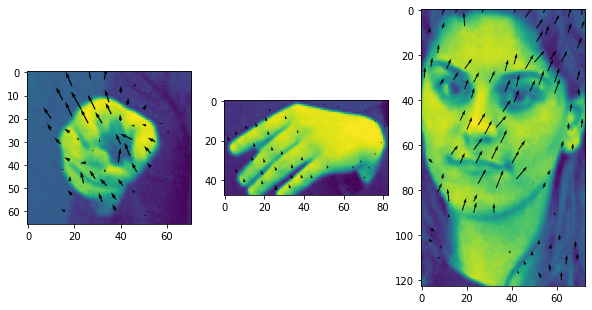

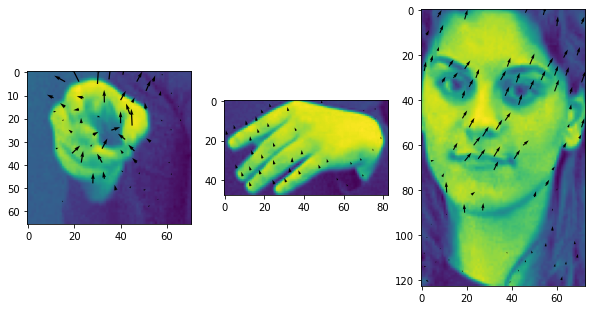

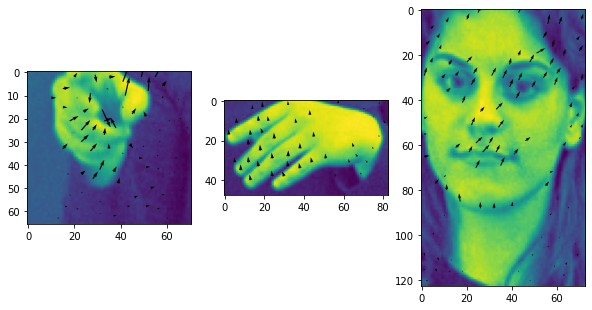

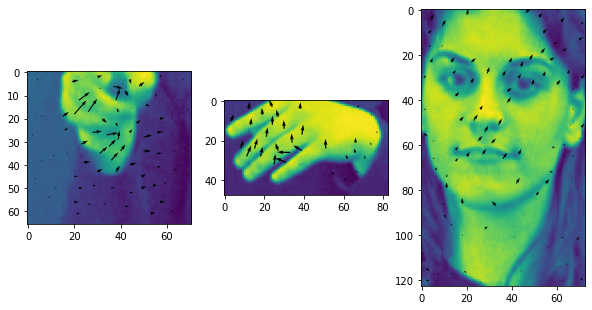

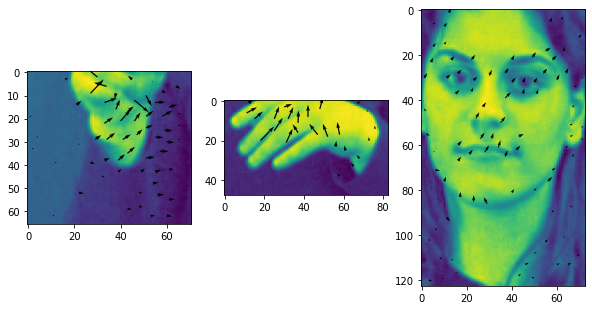

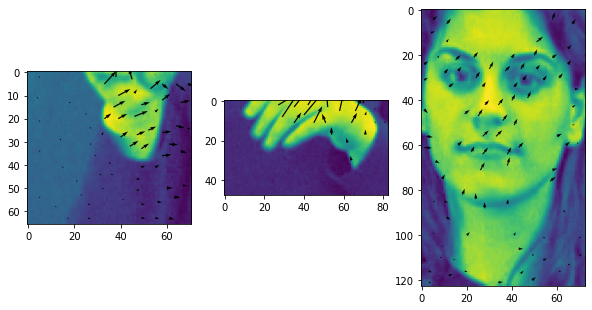

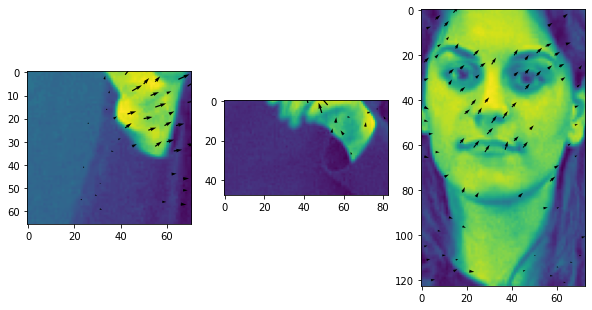

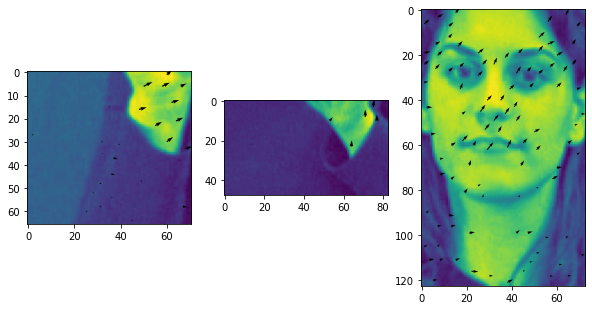

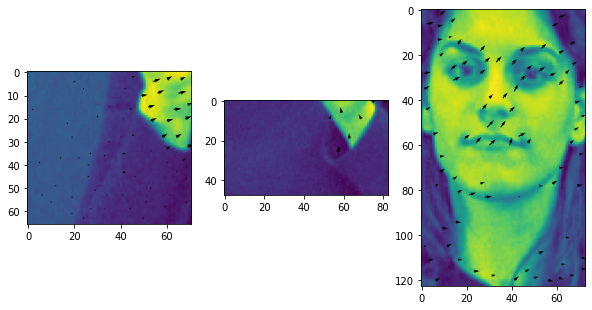

In [42]:
left_hand = [47, 243, 71, 66]
right_hand = [162, 264, 83, 48]
head_box = [138, 88, 73, 123]
#Εκτέλεση Lucas-Kanade για μερικές εικόνες και τα bounding box της καθεμίας
for i in range(1, 10):
    I1 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i),cv.IMREAD_GRAYSCALE)
    I2 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i+1),cv.IMREAD_GRAYSCALE)
    
    L1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L1 = L1/255
    L2 = L2/255
    
    R1 = I1[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R2 = I2[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R1 = R1/255
    R2 = R2/255
    
    H1 = I1[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H2 = I2[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H1 = H1/255
    H2 = H2/255
    
    L_features = get_features(L2, 100, 0.01, 5)
    R_features = get_features(R2, 100, 0.01, 5)
    H_features = get_features(H2, 100, 0.01, 5)
    
    Ld_x,Ld_y = lk(L1, L2, L_features, 4, 0.01, 0, 0)
    Rd_x,Rd_y = lk(R1, R2, R_features, 4, 0.01, 0, 0)
    Hd_x,Hd_y = lk(H1, H2, H_features, 4, 0.01, 0, 0)
    
    Ldx_f,Ldy_f = displ(Ld_x,Ld_y,0.5)
    Rdx_f,Rdy_f = displ(Rd_x,Rd_y,0.5)
    Hdx_f,Hdy_f = displ(Hd_x,Hd_y,0.5)

    
    fig , ax = plt.subplots(1,3, figsize=(10,7))
     
    ax[0].imshow(L1)
    ax[0].quiver(L_features[:,0],L_features[:,1],-Ld_x,-Ld_y,angles='xy',scale=100)
    
    ax[1].imshow(R1)
    ax[1].quiver(R_features[:,0],R_features[:,1],-Rd_x,-Rd_y,angles='xy',scale=100)
    
    ax[2].imshow(H1)
    ax[2].quiver(H_features[:,0],H_features[:,1],-Hd_x,-Hd_y,angles='xy',scale=30)

Wall time: 13.2 s


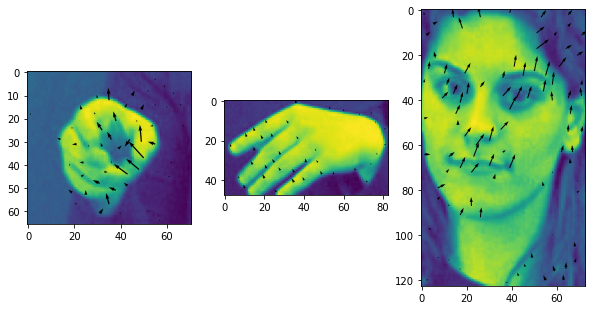

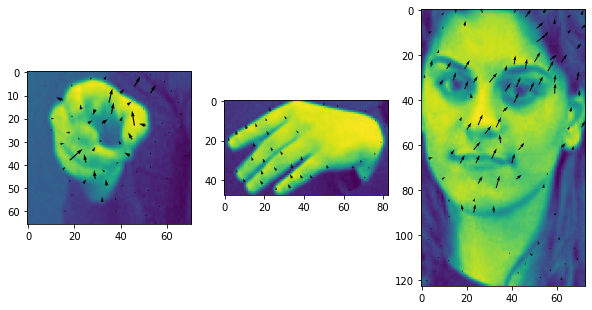

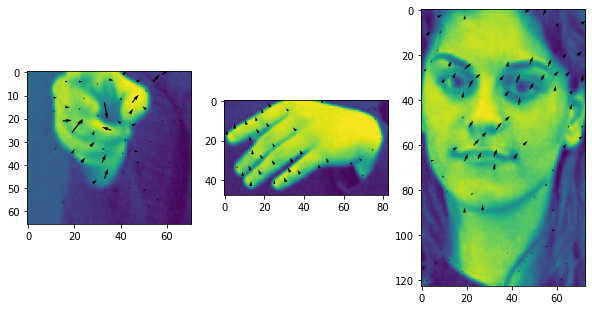

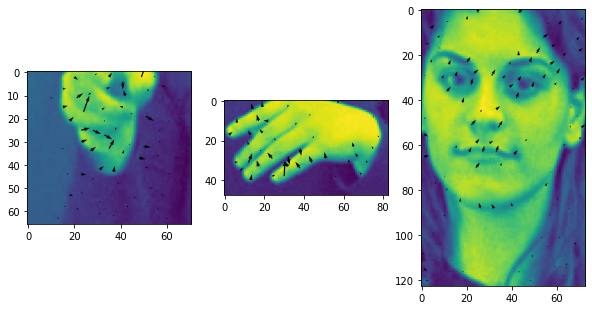

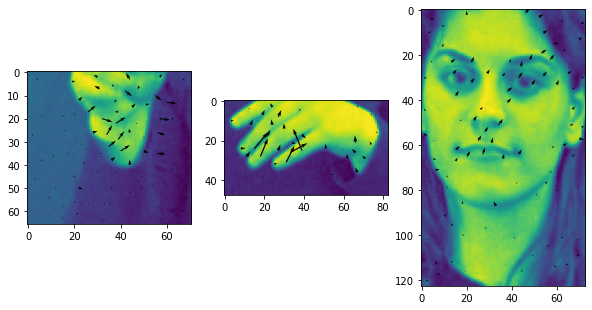

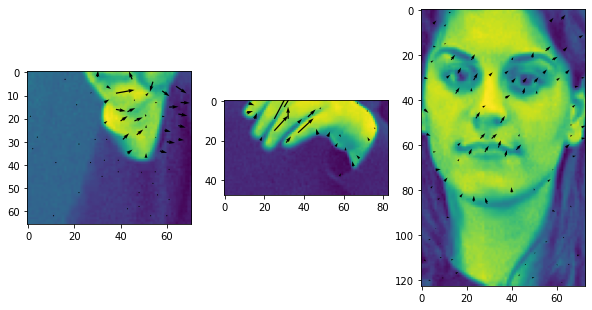

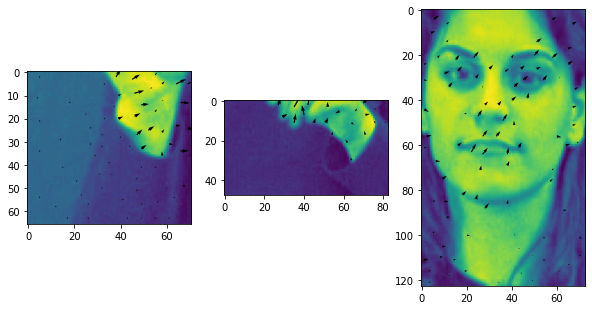

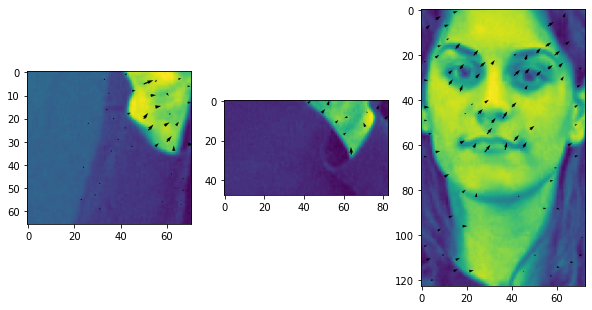

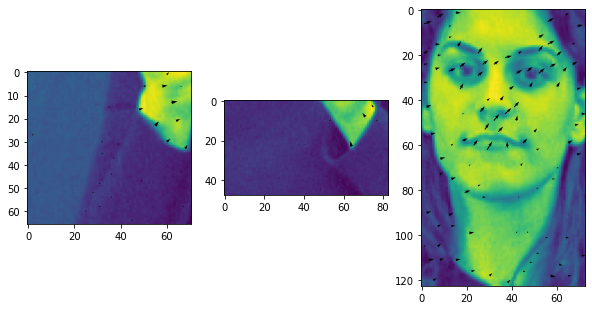

In [43]:
%%time
left_hand = [47, 243, 71, 66]
right_hand = [162, 264, 83, 48]
head_box = [138, 88, 73, 123]
#Εκτέλεση Lucas-Kanade για μερικές εικόνες και τα bounding box της καθεμίας
for i in range(1,10):
    I1 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i),cv.IMREAD_GRAYSCALE)
    I2 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i+1),cv.IMREAD_GRAYSCALE)
    
    L1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L1 = L1/255
    L2 = L2/255
    
    R1 = I1[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R2 = I2[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R1 = R1/255
    R2 = R2/255
    
    H1 = I1[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H2 = I2[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H1 = H1/255
    H2 = H2/255
    
    L_features = get_features(L1, 100, 0.01, 5)
    R_features = get_features(R1, 100, 0.01, 5)
    H_features = get_features(H1, 100, 0.01, 5)
    
    Ld_x,Ld_y = lk(L1, L2, L_features, 2, 0.05, 0, 0)
    Rd_x,Rd_y = lk(R1, R2, R_features, 2, 0.05, 0, 0)
    Hd_x,Hd_y = lk(H1, H2, H_features, 2, 0.05, 0, 0)
    
    Ldx_f,Ldy_f = displ(Ld_x,Ld_y,0.5)
    Rdx_f,Rdy_f = displ(Rd_x,Rd_y,0.5)
    Hdx_f,Hdy_f = displ(Hd_x,Hd_y,0.5)
    
    fig , ax = plt.subplots(1,3, figsize=(10,7))
     
    ax[0].imshow(L1)
    ax[0].quiver(L_features[:,0],L_features[:,1],-Ld_x,-Ld_y,angles='xy',scale=100)
    
    ax[1].imshow(R1)
    ax[1].quiver(R_features[:,0],R_features[:,1],-Rd_x,-Rd_y,angles='xy',scale=100)
    
    ax[2].imshow(H1)
    ax[2].quiver(H_features[:,0],H_features[:,1],-Hd_x,-Hd_y,angles='xy',scale=30)

## 1.2.3

In [44]:
#Ορισμός Πολυκλιμακωτού Lucas-Kanade
def multi_lk(I1, I2,features, rho, epsilon, dx_0, dy_0,Num):
    ker=cv.getGaussianKernel(3,rho)
    gauss2D= ker @ ker.T
    Images = [(I1, I2)]
    Features = [features]
    current_features = features
    current_I1 = I1
    current_I2 = I2
    
    for i in range(Num):                            # Υπολογισμός όλων των εικόνων στις μικρότερες κλίμακες
        current_I1 = cv.filter2D(current_I1,-1,gauss2D)
        current_I2 = cv.filter2D(current_I2,-1,gauss2D)
        
        current_I1 = current_I1[::2,::2]
        current_I2 = current_I2[::2,::2]
        
        Images.append((current_I1, current_I2))
        current_features = current_features//2
        Features.append(current_features)
    
    for i in range(Num):                            # τρέχουμε Lucas-Kanade σε κάθε κλίμακα, ξεκινώντας από τις μικρές
        current_I1, current_I2 = Images.pop()
        current_features = Features.pop()
        
        if i == 0:
            D_x,D_y = lk(current_I1,current_I2,current_features,rho,epsilon,dx_0,dy_0)
        else:
            D_x,D_y = lk(current_I1,current_I2,current_features,rho,epsilon,Displ_x*2,Displ_y*2)

        Displ_x,Displ_y = displ(D_x,D_y,0.5)
     

    return D_x,D_y

Wall time: 5.77 s


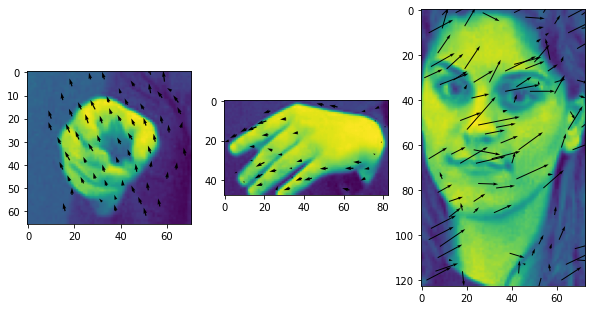

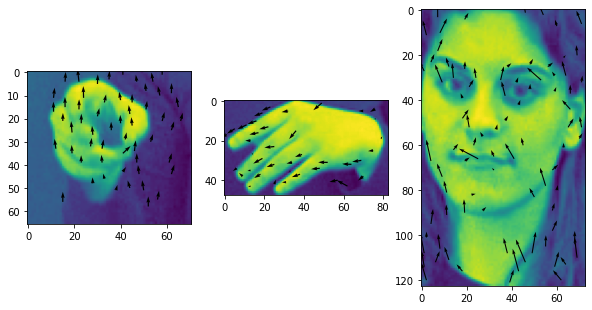

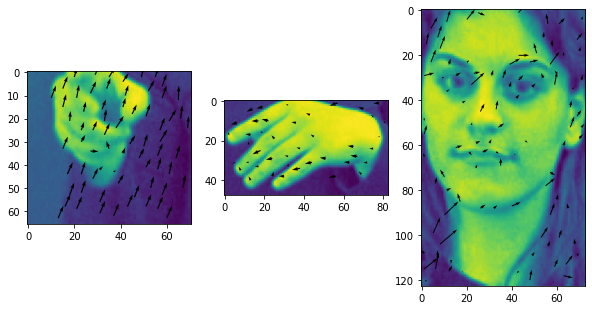

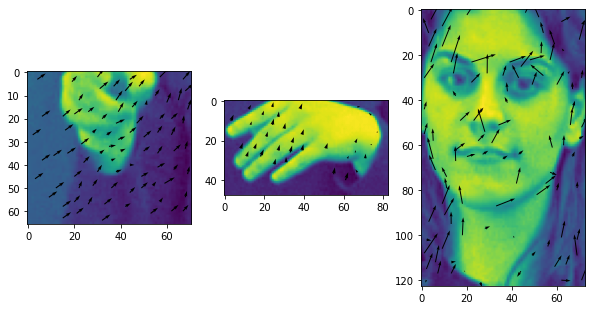

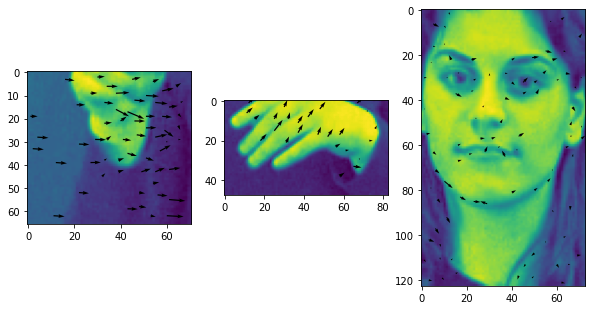

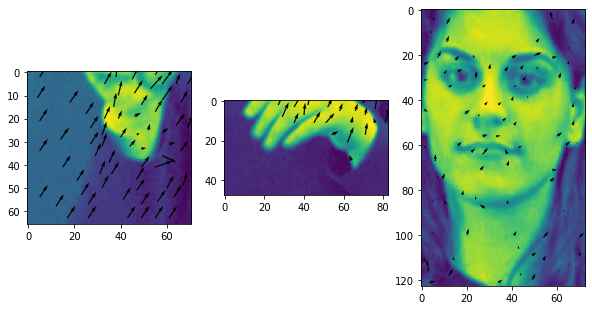

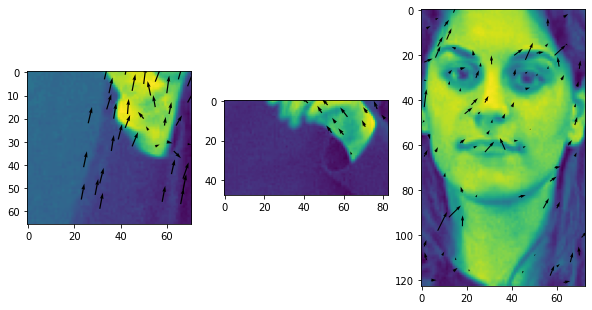

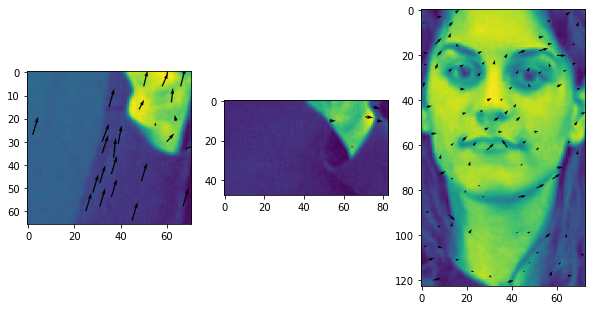

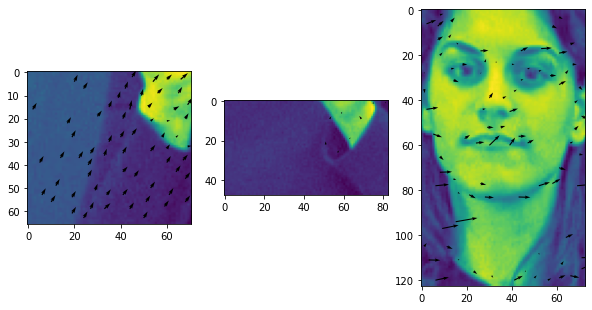

In [45]:
%%time
left_hand = [47, 243, 71, 66]
right_hand = [162, 264, 83, 48]
head_box = [138, 88, 73, 123]
#Εκτέλεση Πολυκλιμακωτού Lucas-Kanade μερικές εικ΄όνες σε πυραμίδα 3ων κλιμάκων
for i in range(1,10):
    I1 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i),cv.IMREAD_GRAYSCALE)
    I2 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i+1),cv.IMREAD_GRAYSCALE)
    L1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L1 = L1/255
    L2 = L2/255
    
    R1 = I1[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R2 = I2[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R1 = R1/255
    R2 = R2/255
    
    H1 = I1[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H2 = I2[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H1 = H1/255
    H2 = H2/255
    
    L_features = get_features(L2, 100, 0.01, 5)
    R_features = get_features(R2, 100, 0.01, 5)
    H_features = get_features(H2, 100, 0.01, 5)
    
    Ld_x,Ld_y = multi_lk(L1, L2, L_features, 1, 0.01, 0, 0, 3)
    Rd_x,Rd_y = multi_lk(R1, R2, R_features, 1, 0.01, 0, 0, 3)
    Hd_x,Hd_y = multi_lk(H1, H2, H_features, 1, 0.01, 0, 0, 3)
    
    Ldx_f,Ldy_f = displ(Ld_x,Ld_y,0.5)
    Rdx_f,Rdy_f = displ(Rd_x,Rd_y,0.5)
    Hdx_f,Hdy_f = displ(Hd_x,Hd_y,0.5)
    
    fig , ax = plt.subplots(1,3, figsize=(10,7))
     
    ax[0].imshow(L1)
    ax[0].quiver(L_features[:,0],L_features[:,1],-Ld_x,-Ld_y,angles='xy',scale=100)
    
    ax[1].imshow(R1)
    ax[1].quiver(R_features[:,0],R_features[:,1],-Rd_x,-Rd_y,angles='xy',scale=100)
    
    ax[2].imshow(H1)
    ax[2].quiver(H_features[:,0],H_features[:,1],-Hd_x,-Hd_y,angles='xy',scale=30)


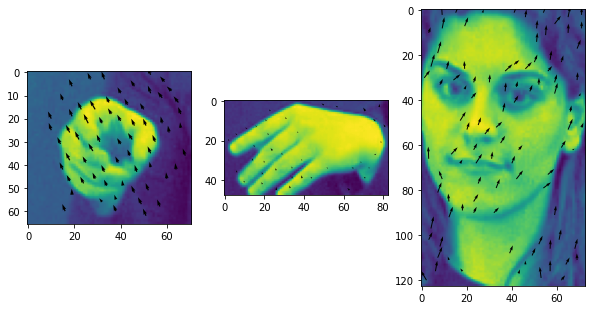

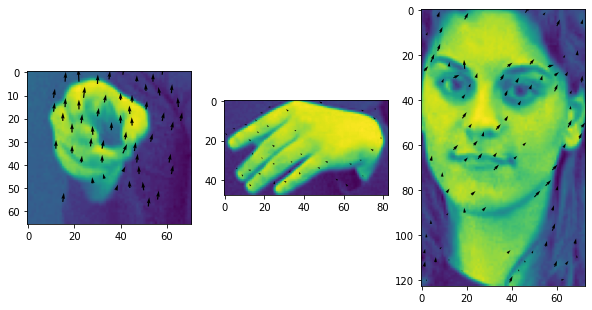

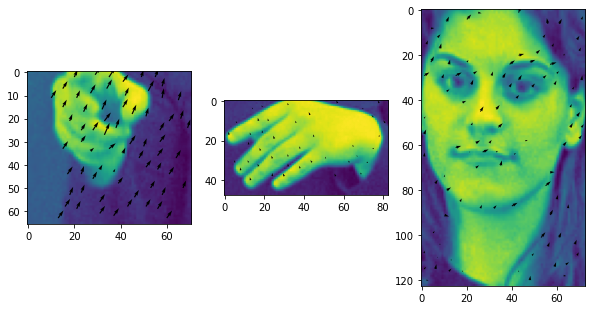

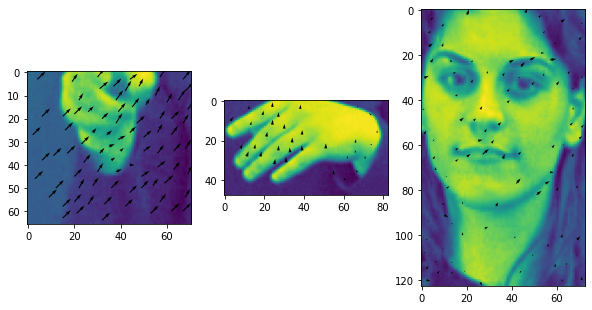

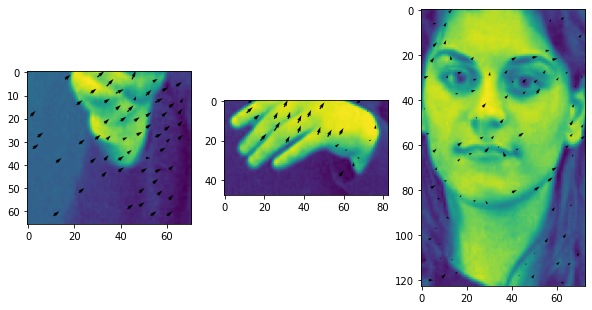

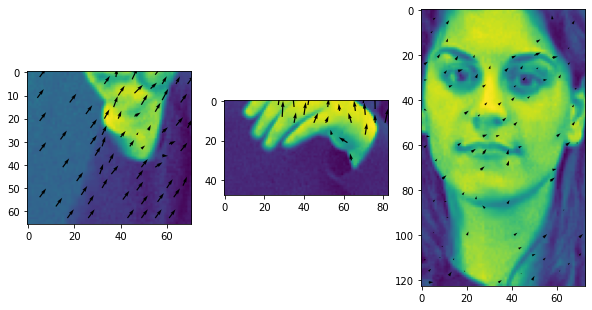

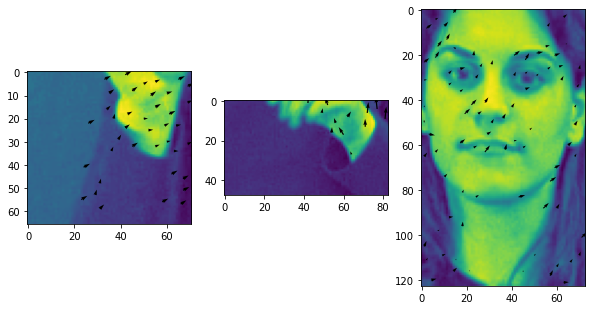

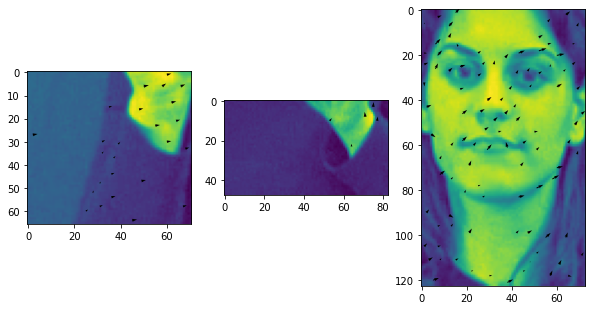

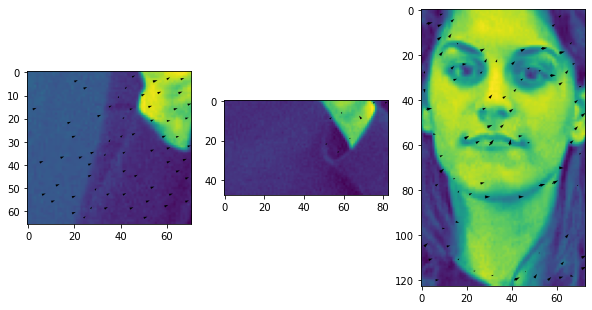

In [46]:
for i in range(1,10):
    I1 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i),cv.IMREAD_GRAYSCALE)
    I2 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i+1),cv.IMREAD_GRAYSCALE)
    L1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L1 = L1/255
    L2 = L2/255
    
    R1 = I1[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R2 = I2[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R1 = R1/255
    R2 = R2/255
    
    H1 = I1[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H2 = I2[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H1 = H1/255
    H2 = H2/255
    
    L_features = get_features(L2, 100, 0.01, 5)
    R_features = get_features(R2, 100, 0.01, 5)
    H_features = get_features(H2, 100, 0.01, 5)
    
    Ld_x,Ld_y = multi_lk(L1, L2, L_features, 1, 0.05, 0, 0,3)
    Rd_x,Rd_y = multi_lk(R1, R2, R_features, 1, 0.05, 0, 0,3)
    Hd_x,Hd_y = multi_lk(H1, H2, H_features, 1, 0.05, 0, 0,3)
    
    Ldx_f,Ldy_f = displ(Ld_x,Ld_y,0.7)
    Rdx_f,Rdy_f = displ(Rd_x,Rd_y,0.7)
    Hdx_f,Hdy_f = displ(Hd_x,Hd_y,0.7)
    
    fig , ax = plt.subplots(1,3, figsize=(10,7))
     
    ax[0].imshow(L1)
    ax[0].quiver(L_features[:,0],L_features[:,1],-Ld_x,-Ld_y,angles='xy',scale=100)
    
    ax[1].imshow(R1)
    ax[1].quiver(R_features[:,0],R_features[:,1],-Rd_x,-Rd_y,angles='xy',scale=100)
    
    ax[2].imshow(H1)
    ax[2].quiver(H_features[:,0],H_features[:,1],-Hd_x,-Hd_y,angles='xy',scale=30)

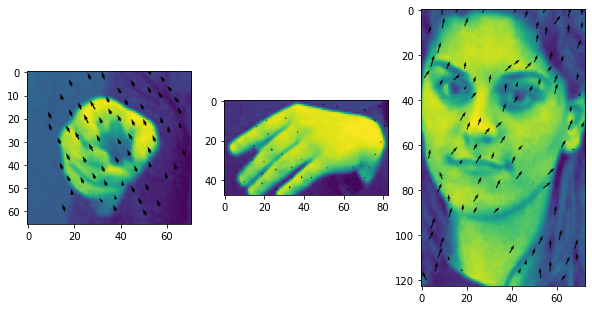

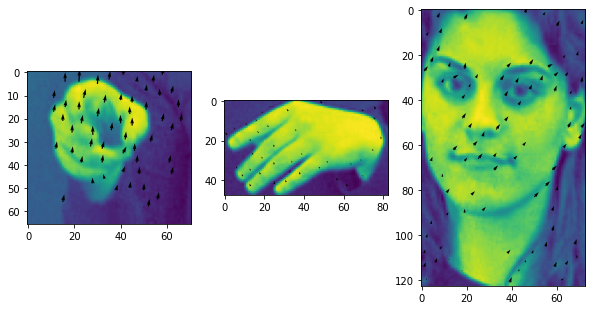

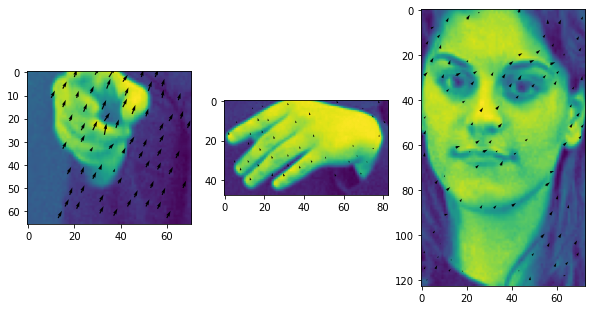

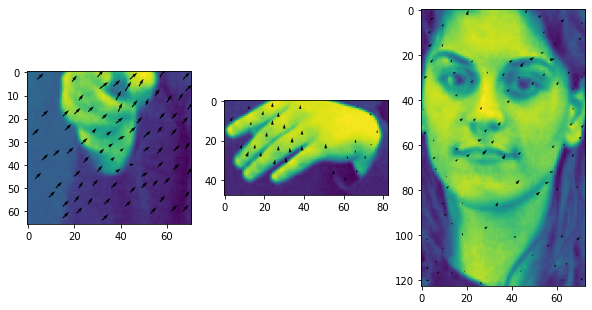

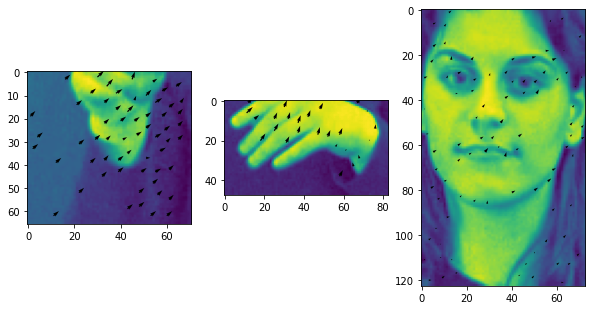

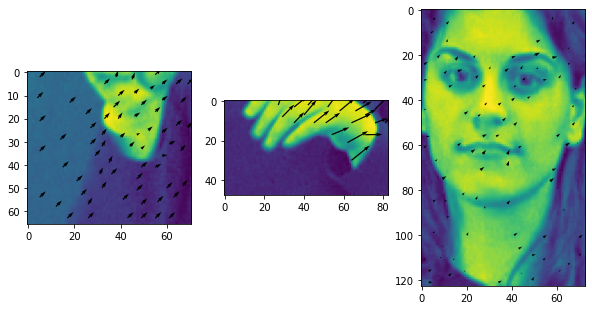

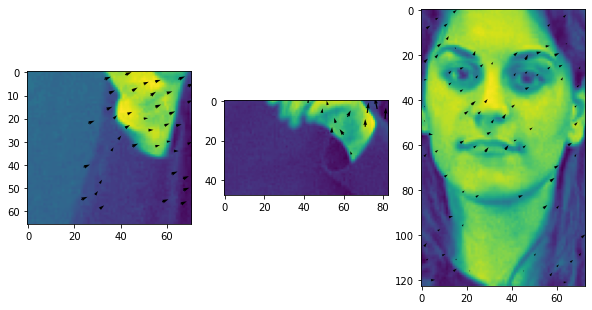

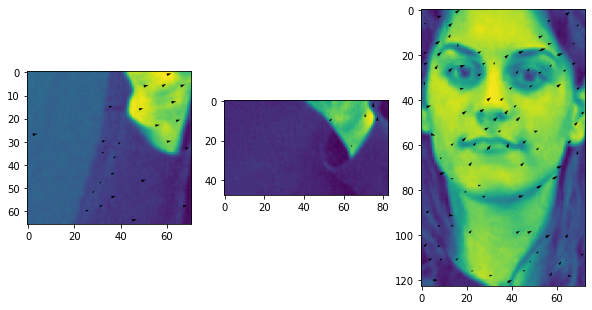

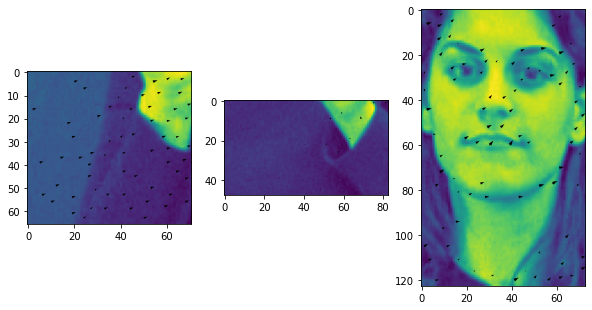

In [47]:
for i in range(1,10):
    I1 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i),cv.IMREAD_GRAYSCALE)
    I2 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i+1),cv.IMREAD_GRAYSCALE)
    L1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L1 = L1/255
    L2 = L2/255
    
    R1 = I1[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R2 = I2[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R1 = R1/255
    R2 = R2/255
    
    H1 = I1[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H2 = I2[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H1 = H1/255
    H2 = H2/255
    
    L_features = get_features(L2, 100, 0.01, 5)
    R_features = get_features(R2, 100, 0.01, 5)
    H_features = get_features(H2, 100, 0.01, 5)
    
    Ld_x,Ld_y = multi_lk(L1, L2, L_features, 1, 0.1, 0, 0,3)
    Rd_x,Rd_y = multi_lk(R1, R2, R_features, 1, 0.1, 0, 0,3)
    Hd_x,Hd_y = multi_lk(H1, H2, H_features, 1, 0.1, 0, 0,3)
    
    Ldx_f,Ldy_f = displ(Ld_x,Ld_y,0.7)
    Rdx_f,Rdy_f = displ(Rd_x,Rd_y,0.7)
    Hdx_f,Hdy_f = displ(Hd_x,Hd_y,0.7)
    
    fig , ax = plt.subplots(1,3, figsize=(10,7))
     
    ax[0].imshow(L1)
    ax[0].quiver(L_features[:,0],L_features[:,1],-Ld_x,-Ld_y,angles='xy',scale=100)
    
    ax[1].imshow(R1)
    ax[1].quiver(R_features[:,0],R_features[:,1],-Rd_x,-Rd_y,angles='xy',scale=100)
    
    ax[2].imshow(H1)
    ax[2].quiver(H_features[:,0],H_features[:,1],-Hd_x,-Hd_y,angles='xy',scale=30)

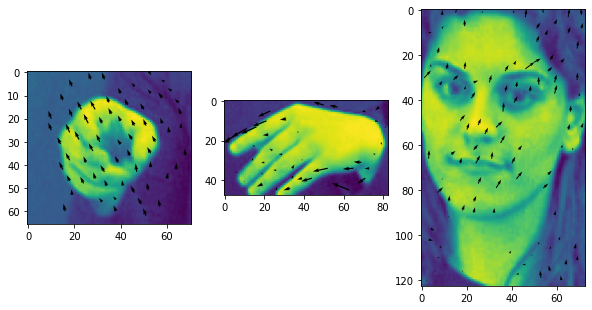

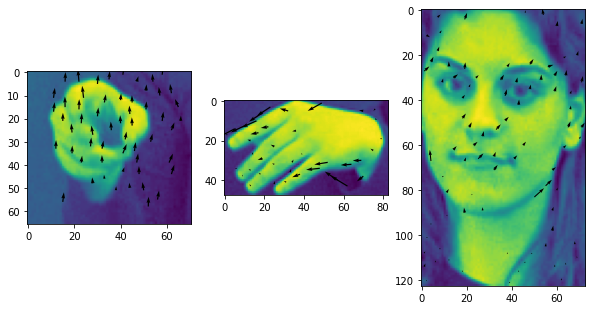

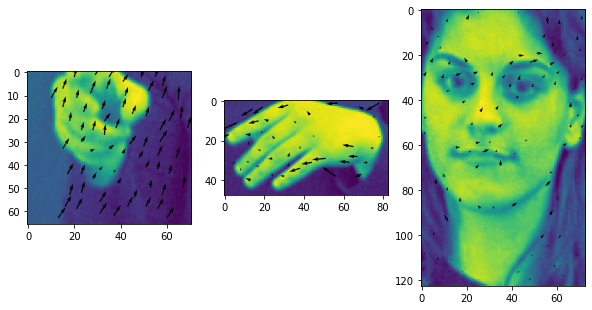

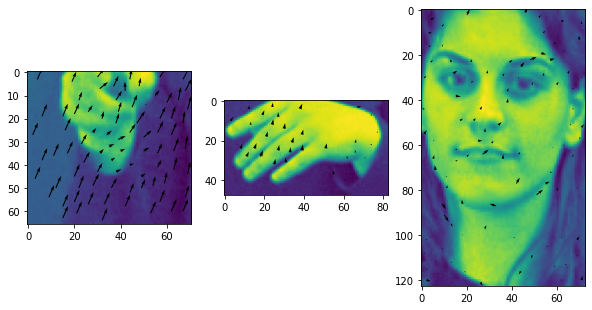

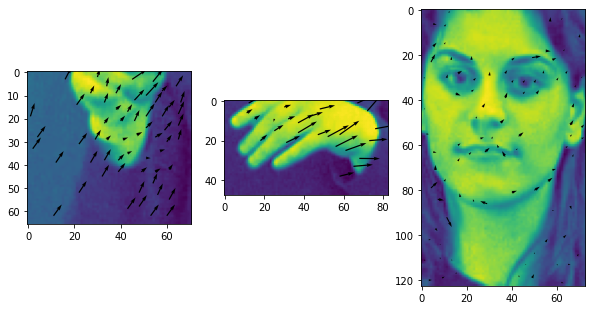

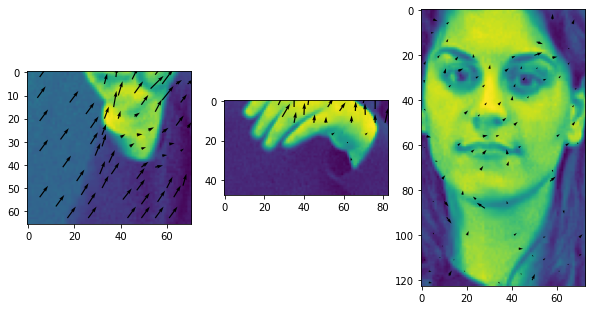

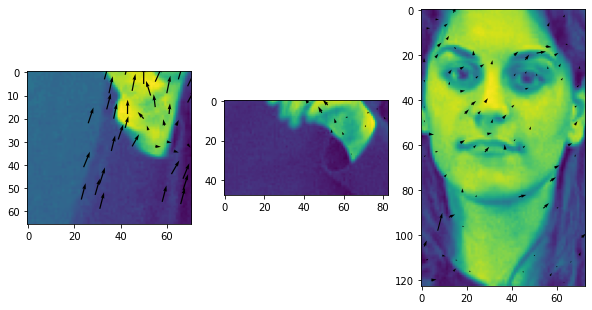

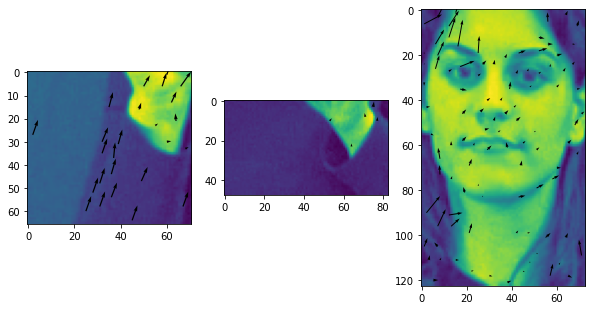

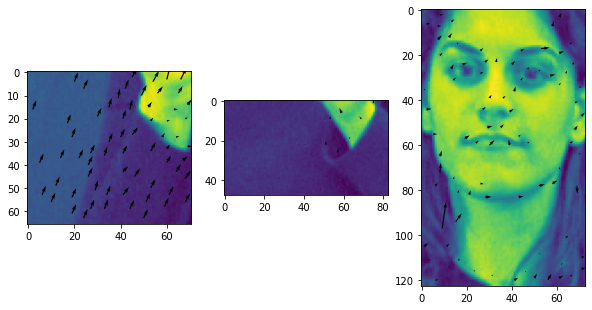

In [48]:
for i in range(1,10):
    I1 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i),cv.IMREAD_GRAYSCALE)
    I2 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i+1),cv.IMREAD_GRAYSCALE)
    L1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L1 = L1/255
    L2 = L2/255
    
    R1 = I1[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R2 = I2[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R1 = R1/255
    R2 = R2/255
    
    H1 = I1[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H2 = I2[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H1 = H1/255
    H2 = H2/255
    
    L_features = get_features(L2, 100, 0.01, 5)
    R_features = get_features(R2, 100, 0.01, 5)
    H_features = get_features(H2, 100, 0.01, 5)
    
    Ld_x,Ld_y = multi_lk(L1, L2, L_features, 2, 0.005, 0, 0,3)
    Rd_x,Rd_y = multi_lk(R1, R2, R_features, 2, 0.005, 0, 0,3)
    Hd_x,Hd_y = multi_lk(H1, H2, H_features, 2, 0.005, 0, 0,3)
    
    Ldx_f,Ldy_f = displ(Ld_x,Ld_y,0.4)
    Rdx_f,Rdy_f = displ(Rd_x,Rd_y,0.4)
    Hdx_f,Hdy_f = displ(Hd_x,Hd_y,0.4)
    
    fig , ax = plt.subplots(1,3, figsize=(10,7))
     
    ax[0].imshow(L1)
    ax[0].quiver(L_features[:,0],L_features[:,1],-Ld_x,-Ld_y,angles='xy',scale=100)
    
    ax[1].imshow(R1)
    ax[1].quiver(R_features[:,0],R_features[:,1],-Rd_x,-Rd_y,angles='xy',scale=100)
    
    ax[2].imshow(H1)
    ax[2].quiver(H_features[:,0],H_features[:,1],-Hd_x,-Hd_y,angles='xy',scale=30)

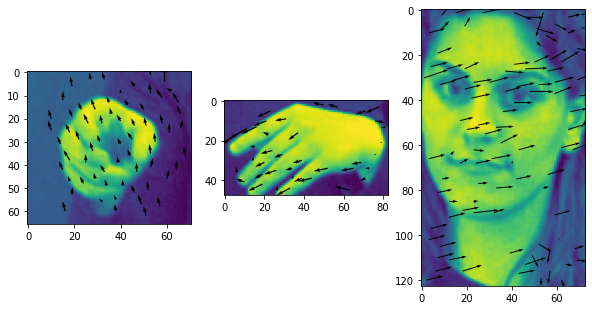

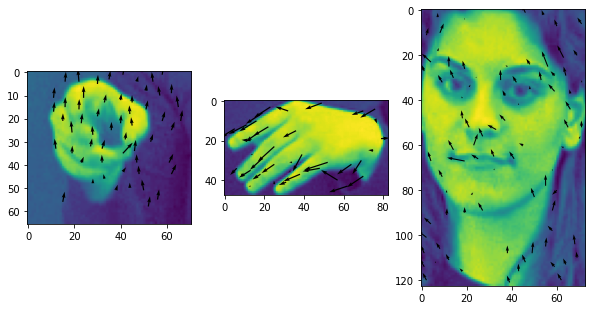

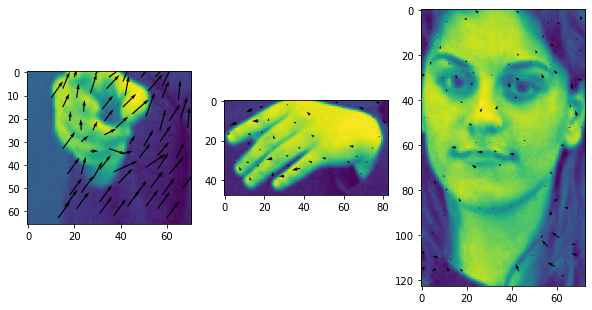

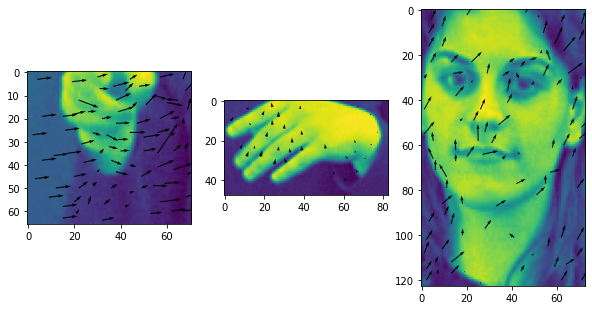

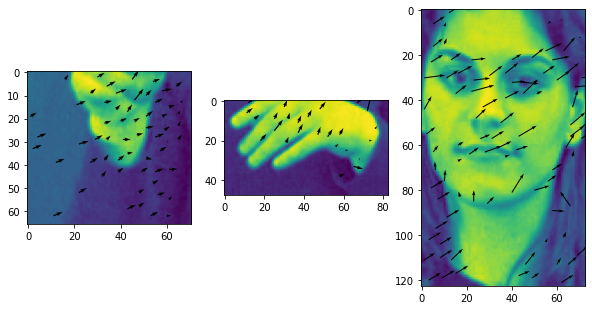

...

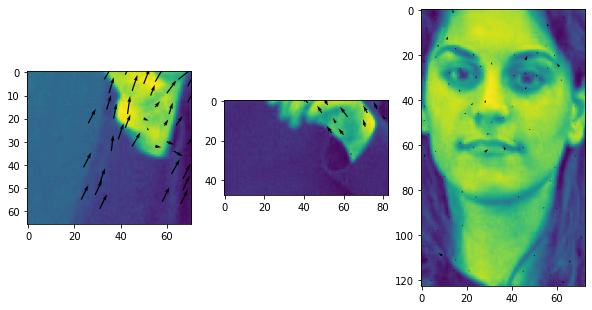

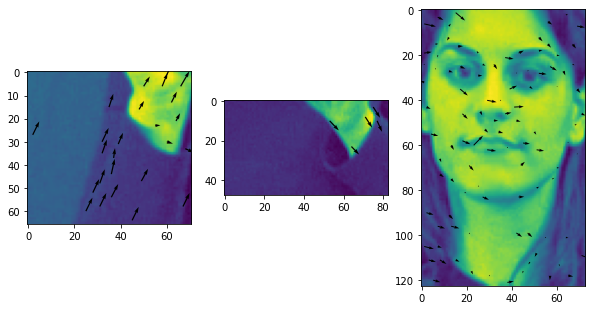

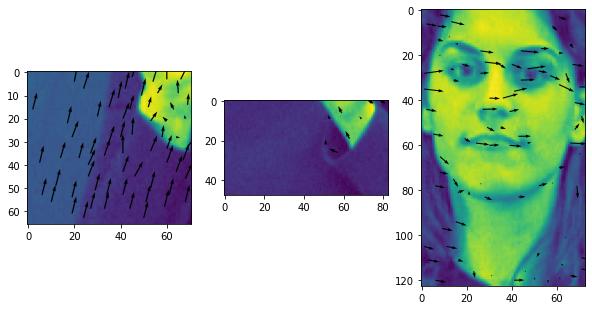

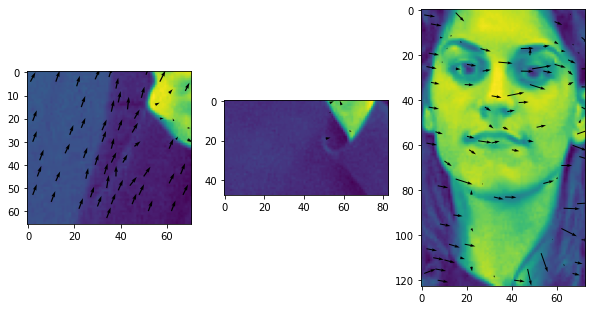

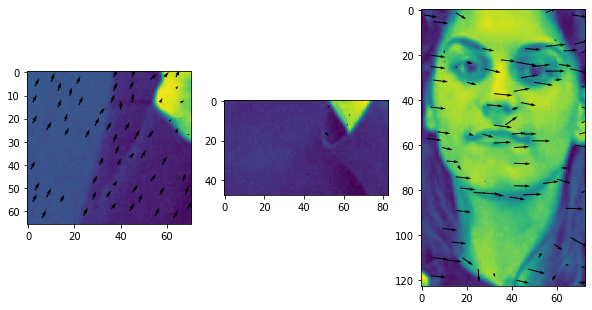

In [49]:
for i in range(1,12):
    I1 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i),cv.IMREAD_GRAYSCALE)
    I2 = cv.imread("part1 - GreekSignLanguage/{}.png".format(i+1),cv.IMREAD_GRAYSCALE)
    L1 = I1[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L2 = I2[left_hand[1]:left_hand[1]+left_hand[3], left_hand[0]:left_hand[0]+left_hand[2]]
    L1 = L1/255
    L2 = L2/255
    
    R1 = I1[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R2 = I2[right_hand[1]:right_hand[1]+right_hand[3], right_hand[0]:right_hand[0]+right_hand[2]]
    R1 = R1/255
    R2 = R2/255
    
    H1 = I1[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H2 = I2[head_box[1]:head_box[1]+head_box[3], head_box[0]:head_box[0]+head_box[2]]
    H1 = H1/255
    H2 = H2/255
    
    L_features = get_features(L2, 100, 0.01, 5)
    R_features = get_features(R2, 100, 0.01, 5)
    H_features = get_features(H2, 100, 0.01, 5)
    
    Ld_x,Ld_y = multi_lk(L1, L2, L_features, 1, 0.003, 0, 0,3)
    Rd_x,Rd_y = multi_lk(R1, R2, R_features, 1, 0.003, 0, 0,3)
    Hd_x,Hd_y = multi_lk(H1, H2, H_features, 1, 0.003, 0, 0,3)
    
    Ldx_f,Ldy_f = displ(Ld_x,Ld_y,0.7)
    Rdx_f,Rdy_f = displ(Rd_x,Rd_y,0.7)
    Hdx_f,Hdy_f = displ(Hd_x,Hd_y,0.7)
    
    fig , ax = plt.subplots(1,3, figsize=(10,7))
     
    ax[0].imshow(L1)
    ax[0].quiver(L_features[:,0],L_features[:,1],-Ld_x,-Ld_y,angles='xy',scale=100)
    
    ax[1].imshow(R1)
    ax[1].quiver(R_features[:,0],R_features[:,1],-Rd_x,-Rd_y,angles='xy',scale=100)
    
    ax[2].imshow(H1)
    ax[2].quiver(H_features[:,0],H_features[:,1],-Hd_x,-Hd_y,angles='xy',scale=100)

## Μέρος 2ο

## 2.1

In [1]:
from cv22_lab2_2_utils import read_video, show_detection, orientation_histogram, bag_of_words, svm_train_test
from scipy.ndimage import convolve1d
import numpy as np
import scipy
import scipy.io as sio
import cv2 as cv 
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
from scipy.ndimage import label
import matplotlib.patches as patches

In [2]:
def Detector(vid,sigma,tau,s,k):
    w = 4/tau
    n_s = int(np.ceil(3*sigma)*2+1)
    ker_s = cv.getGaussianKernel(n_s,sigma)[:,0]

    n_t = int(np.ceil(3*tau)*2+1)
    ker_t = cv.getGaussianKernel(n_t,tau)[:,0]


    #Harris Detector
    L = convolve1d(vid, ker_s, axis = 0)
    L = convolve1d(L, ker_s ,axis = 1)
    L = convolve1d(L, ker_t ,axis = 2)
    
    ker_diff = np.array([-1,0,1]).T
    
    Lx = convolve1d(L,ker_diff, axis = 0)
    Ly = convolve1d(L,ker_diff, axis = 1)
    Lt = convolve1d(L,ker_diff, axis = 2)
    
    n_ss = int(np.ceil(3*sigma*s)*2+1)
    ker_ss = cv.getGaussianKernel(n_ss,sigma*s)[:,0]

    n_st = int(np.ceil(3*tau*s)*2+1)
    ker_st = cv.getGaussianKernel(n_st,tau*s)[:,0]

    A11 = Lx * Lx
    A12 = Lx * Ly
    A13 = Lx * Lt
    A21 = A12
    A22 = Ly * Ly
    A23 = Ly * Lt
    A31 = Lx * Lt
    A32 = A23
    A33 = Lt * Lt

    J = np.array([[A11,A12,A13],[A21,A22,A23],[A31,A32,A33]])

    M = convolve1d(J, ker_ss ,axis = 2)
    M = convolve1d(M, ker_ss ,axis = 3)
    M = convolve1d(M, ker_st ,axis = 4)

    det = np.linalg.det(M.T).T
    trace = np.trace(M, axis1 = 0, axis2 = 1)
    
    H_harris = det - k * np.power(trace,3)
    
    #Gabor Detector
    lim = int(np.ceil(3*tau)*2+1)
    time = np.linspace(-2*tau,2*tau,lim)

    heu = np.cos(2*np.pi*time*w)*np.exp(-time**2 / (2*(tau**2)))
    heu = heu/np.linalg.norm(heu ,ord = 1)

    hod = np.sin(2*np.pi*time*w)*np.exp(-time**2 / (2*(tau**2)))
    hod = hod/np.linalg.norm(hod ,ord = 1)
    
    H1 = convolve1d(vid, ker_s ,axis = 0)
    H1 = convolve1d(H1, ker_s ,axis = 1)
    H1 = convolve1d(H1, heu ,axis = 2)

    H2 = convolve1d(vid, ker_s ,axis = 0)
    H2 = convolve1d(H2, ker_s ,axis = 1)
    H2 = convolve1d(H2, hod ,axis = 2)
    
    H_gabor = H1 * H1 + H2 * H2
    
    harris_points = np.unravel_index(np.argsort(H_harris, axis = None),H_harris.shape)
    gabor_points = np.unravel_index(np.argsort(H_gabor, axis = None),H_gabor.shape)
    
    scale_harris = np.ones((harris_points[0].shape))*sigma
    scale_gabor = np.ones((gabor_points[0].shape))*sigma
    
    Harris_Mat = np.vstack([harris_points[1],harris_points[0],harris_points[2],scale_harris]).T
    Harris_Mat = Harris_Mat[-600:,:]
    
    Gabor_Mat = np.vstack([gabor_points[1],gabor_points[0],gabor_points[2],scale_gabor]).T
    Gabor_Mat = Gabor_Mat[-600:,:]
    
    return Harris_Mat,Gabor_Mat

In [3]:
vid = read_video("part2 - SpatioTemporal/boxing/person12_boxing_d3_uncomp.avi",200)
vid = vid/255
#Πολυκλιμακωτή προσέγγιση για τους ανιχνευτές στις κλίμακες 3,2,1
H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)


In [4]:
Harris = np.vstack([H_1,H_2,H_3])
Gabor = np.vstack([G_1,G_2,G_3])
Harris.shape

(1800, 4)

In [6]:
vid = read_video("part2 - SpatioTemporal/boxing/person12_boxing_d3_uncomp.avi",200)
vid = vid/255
H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)
Harris = np.vstack([H_1,H_2,H_3])
Gabor = np.vstack([G_1,G_2,G_3])

show_detection(vid,Harris,save_path = "./Video_box_harris")
show_detection(vid,Gabor,save_path = "./Video_box_gabor")

vid = read_video("part2 - SpatioTemporal/running/person01_running_d1_uncomp.avi",200)
vid = vid/255
H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)
Harris = np.vstack([H_1,H_2,H_3])
Gabor = np.vstack([G_1,G_2,G_3])

show_detection(vid,Harris,save_path = "./Video_run_harris")
show_detection(vid,Gabor,save_path = "./Video_run_gabor")

vid = read_video("part2 - SpatioTemporal/walking/person04_walking_d1_uncomp.avi",200)
vid = vid/255
H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)
Harris = np.vstack([H_1,H_2,H_3])
Gabor = np.vstack([G_1,G_2,G_3])

show_detection(vid,Harris,save_path = "./Video_walk_harris")
show_detection(vid,Gabor,save_path = "./Video_walk_gabor")

KeyboardInterrupt: 

## 2.2

In [7]:
vid = read_video("part2 - SpatioTemporal/boxing/person12_boxing_d3_uncomp.avi",200)

In [7]:
def Descriptors(vid,nbins,n,m,points):
    
    vid1 = vid/255
    vid2 = vid.astype(np.uint8)
    
    #HOG
    ker_diff = np.array([-1,0,1]).T

    Vx = convolve1d(vid1,ker_diff, axis = 0)

    Vy = convolve1d(vid1,ker_diff, axis = 1)

    desc_hog = []

    for i in points:
        pad = np.ceil(4 * i[3])
        x1 = max(0,int(i[1]-pad))
        x2 = min(Vx.shape[0],int(i[1]+pad))
        y1 = max(0,int(i[0]-pad))
        y2 = min(Vx.shape[1],int(i[0]+pad))
        frame = int(i[2])
        desc_hog.append(orientation_histogram(Vx[x1:x2,y1:y2,frame],Vy[x1:x2,y1:y2,frame],nbins,np.array([n,m])))
       
    
    desc_hog = np.array(desc_hog)
        
    #HOF
    flow_total_x = np.zeros(vid.shape)
    flow_total_y = np.zeros(vid.shape)
    oflow = cv.DualTVL1OpticalFlow_create(nscales=1)

    for i in range(0,199):   
        flow = oflow.calc(vid2[:,:,i],vid2[:,:,i+1], None)
        flow_total_x[:,:,i] = flow[:,:,1]
        flow_total_y[:,:,i] = flow[:,:,0]

    desc_hof = []
    for i in points:
        pad = np.ceil(4 * i[3])
        x1 = max(0,int(i[1]-pad))
        x2 = min(flow_total_x.shape[0],int(i[1]+pad))
        y1 = max(0,int(i[0]-pad))
        y2 = min(flow_total_x.shape[1],int(i[0]+pad))
        frame = int(i[2])
        desc_hof.append(orientation_histogram(flow_total_x[x1:x2,y1:y2,frame],flow_total_y[x1:x2,y1:y2,frame],nbins,np.array([n,m])))
    
    desc_hof = np.array(desc_hof)
        
    return desc_hog, desc_hof

In [9]:
A,B = Descriptors(vid,10,4,4,Gabor)

## 2.3

### 2.3.1

In [9]:
import joblib

In [13]:
train_run = """person01_running_d1_uncomp.avi
person05_running_d1_uncomp.avi
person09_running_d1_uncomp.avi
person02_running_d2_uncomp.avi
person06_running_d2_uncomp.avi
person23_running_d2_uncomp.avi
person03_running_d3_uncomp.avi
person07_running_d3_uncomp.avi
person06_running_d3_uncomp.avi
person08_running_d4_uncomp.avi
person04_running_d4_uncomp.avi
person21_running_d4_uncomp.avi""".split("\n")

train_box = """person25_boxing_d1_uncomp.avi
person21_boxing_d1_uncomp.avi
person04_boxing_d1_uncomp.avi
person22_boxing_d2_uncomp.avi
person01_boxing_d2_uncomp.avi
person05_boxing_d2_uncomp.avi
person23_boxing_d3_uncomp.avi
person02_boxing_d3_uncomp.avi
person12_boxing_d3_uncomp.avi
person09_boxing_d4_uncomp.avi
person03_boxing_d4_uncomp.avi
person24_boxing_d4_uncomp.avi""".split("\n")

train_walk = """person15_walking_d1_uncomp.avi
person04_walking_d1_uncomp.avi
person19_walking_d1_uncomp.avi
person16_walking_d2_uncomp.avi
person12_walking_d2_uncomp.avi
person05_walking_d2_uncomp.avi
person17_walking_d3_uncomp.avi
person06_walking_d3_uncomp.avi
person13_walking_d3_uncomp.avi
person25_walking_d4_uncomp.avi
person14_walking_d4_uncomp.avi
person18_walking_d4_uncomp.avi""".split("\n")

In [14]:
test_run = """person10_running_d2_uncomp.avi
person20_running_d1_uncomp.avi
person24_running_d3_uncomp.avi
person25_running_d4_uncomp.avi""".split("\n")

test_box = """person06_boxing_d1_uncomp.avi
person07_boxing_d3_uncomp.avi
person11_boxing_d2_uncomp.avi
person15_boxing_d4_uncomp.avi""".split("\n")

test_walk = """person07_walking_d4_uncomp.avi
person08_walking_d2_uncomp.avi
person11_walking_d1_uncomp.avi
person20_walking_d3_uncomp.avi""".split("\n")

### 2.3.2

In [96]:
desc_train_hof_harris = []
desc_train_hog_harris = []
desc_train_hof_gabor = []
desc_train_hog_gabor = []
train_label = []

desc_test_hof_harris = []
desc_test_hog_harris = []
desc_test_hof_gabor = []
desc_test_hog_gabor = []
test_label = []

In [15]:
desc_train_hof_harris = joblib.load("desc_train_hof_harris.pkl")
desc_train_hog_harris = joblib.load("desc_train_hog_harris.pkl")
desc_train_hof_gabor = joblib.load("desc_train_hof_gabor.pkl")
desc_train_hog_gabor = joblib.load("desc_train_hog_gabor.pkl")
train_label = []

desc_test_hof_harris = joblib.load("desc_test_hof_harris.pkl")
desc_test_hog_harris = joblib.load("desc_test_hog_harris.pkl")
desc_test_hof_gabor = joblib.load("desc_test_hof_gabor.pkl")
desc_test_hog_gabor = joblib.load("desc_test_hog_gabor.pkl")
test_label = []

In [16]:
for i in train_box:
    vid = read_video("part2 - SpatioTemporal/boxing/{}".format(i),200)
    H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
    H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
    H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)
    Harris = np.vstack([H_1,H_2,H_3])
    Gabor = np.vstack([G_1,G_2,G_3])
    
    
    hof_harris,hog_harris = Descriptors(vid, 10 , 4 ,4, Harris)
    hof_gabor,hog_gabor = Descriptors(vid, 10 , 4 ,4, Gabor)
    
    desc_train_hof_harris.append(hof_harris)
    desc_train_hog_harris.append(hog_harris)
    desc_train_hof_gabor.append(hof_gabor)
    desc_train_hog_gabor.append(hog_gabor)
    train_label.append(0)
    

for i in train_walk:
    vid = read_video("part2 - SpatioTemporal/walking/{}".format(i),200)
    H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
    H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
    H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)
    Harris = np.vstack([H_1,H_2,H_3])
    Gabor = np.vstack([G_1,G_2,G_3])
    
    hof_harris,hog_harris = Descriptors(vid, 10 , 4 ,4, Harris)
    hof_gabor,hog_gabor = Descriptors(vid, 10 , 4 ,4, Gabor)
    
    desc_train_hof_harris.append(hof_harris)
    desc_train_hog_harris.append(hog_harris)
    desc_train_hof_gabor.append(hof_gabor)
    desc_train_hog_gabor.append(hog_gabor)
    train_label.append(1)
    
    

for i in train_run:
    vid = read_video("part2 - SpatioTemporal/running/{}".format(i),200)
    H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
    H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
    H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)
    Harris = np.vstack([H_1,H_2,H_3])
    Gabor = np.vstack([G_1,G_2,G_3])
    
    hof_harris,hog_harris = Descriptors(vid, 10 , 4 ,4, Harris)
    hof_gabor,hog_gabor = Descriptors(vid, 10 , 4 ,4, Gabor)
    
    desc_train_hof_harris.append(hof_harris)
    desc_train_hog_harris.append(hog_harris)
    desc_train_hof_gabor.append(hof_gabor)
    desc_train_hog_gabor.append(hog_gabor)
    train_label.append(2)

In [17]:
for i in test_box:
    vid = read_video("part2 - SpatioTemporal/boxing/{}".format(i),200)
    H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
    H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
    H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)
    Harris = np.vstack([H_1,H_2,H_3])
    Gabor = np.vstack([G_1,G_2,G_3])
    
    hof_harris,hog_harris = Descriptors(vid, 10 , 4 ,4, Harris)
    hof_gabor,hog_gabor = Descriptors(vid, 10 , 4 ,4, Gabor)
    
    desc_test_hof_harris.append(hof_harris)
    desc_test_hog_harris.append(hog_harris)
    desc_test_hof_gabor.append(hof_gabor)
    desc_test_hog_gabor.append(hog_gabor)
    test_label.append(0)
    
    
    
for i in test_walk:
    vid = read_video("part2 - SpatioTemporal/walking/{}".format(i),200)
    H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
    H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
    H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)
    Harris = np.vstack([H_1,H_2,H_3])
    Gabor = np.vstack([G_1,G_2,G_3])
    
    hof_harris,hog_harris = Descriptors(vid, 10 , 4 ,4, Harris)
    hof_gabor,hog_gabor = Descriptors(vid, 10 , 4 ,4, Gabor)
    
    desc_test_hof_harris.append(hof_harris)
    desc_test_hog_harris.append(hog_harris)
    desc_test_hof_gabor.append(hof_gabor)
    desc_test_hog_gabor.append(hog_gabor)
    test_label.append(1)

    
    
    
for i in test_run:
    vid = read_video("part2 - SpatioTemporal/running/{}".format(i),200)
    H_1, G_1 = Detector(vid, 3, 1.5, 2, 0.005)
    H_2, G_2 = Detector(vid, 2, 1.5, 2, 0.005)
    H_3, G_3 = Detector(vid, 1, 1.5, 2, 0.005)
    Harris = np.vstack([H_1,H_2,H_3])
    Gabor = np.vstack([G_1,G_2,G_3])
    
    hof_harris,hog_harris = Descriptors(vid, 10 , 4 ,4, Harris)
    hof_gabor,hog_gabor = Descriptors(vid, 10 , 4 ,4, Gabor)
    
    desc_test_hof_harris.append(hof_harris)
    desc_test_hog_harris.append(hog_harris)
    desc_test_hof_gabor.append(hof_gabor)
    desc_test_hog_gabor.append(hog_gabor)
    test_label.append(2)

### 2.3.2

In [55]:
bow_train_hog_gabor , bow_test_hog_gabor = bag_of_words(desc_train_hog_gabor,desc_test_hog_gabor,30)
bow_train_hog_harris , bow_test_hog_harris = bag_of_words(desc_train_hog_harris,desc_test_hog_harris,30)
bow_train_hof_gabor , bow_test_hof_gabor = bag_of_words(desc_train_hof_gabor,desc_test_hof_gabor,30)
bow_train_hof_harris , bow_test_hof_harris = bag_of_words(desc_train_hof_harris,desc_test_hof_harris,30)

In [56]:
desc_train_hog_hof_harris = []
desc_train_hog_hof_gabor = []

desc_test_hog_hof_harris = []
desc_test_hog_hof_gabor = []

for i in range(len(desc_train_hog_gabor)):
    desc_train_hog_hof_harris.append(np.vstack([desc_train_hof_harris[i],desc_train_hog_harris[i]]))
    desc_train_hog_hof_gabor.append(np.vstack([desc_train_hof_gabor[i],desc_train_hog_gabor[i]]))
    
for i in range(len(desc_test_hog_gabor)):    
    desc_test_hog_hof_harris.append(np.vstack([desc_test_hof_harris[i],desc_test_hog_harris[i]]))
    desc_test_hog_hof_gabor.append(np.vstack([desc_test_hof_gabor[i],desc_test_hog_gabor[i]]))
    
bow_train_hog_hof_gabor , bow_test_hog_hof_gabor = bag_of_words(desc_train_hog_hof_gabor,desc_test_hog_hof_gabor,30)
bow_train_hog_hof_harris , bow_test_hog_hof_harris = bag_of_words(desc_train_hog_hof_harris,desc_test_hog_hof_harris,30)

### 2.3.3

In [57]:
#HOG-Gabor
accuracy_hogg,pred_hogg = svm_train_test(bow_train_hog_gabor,train_label,bow_test_hog_gabor,test_label)

print(f"Χρησιμοποιώντας HOG Descriptor και Gabor Points έχουμε accuracy: {accuracy_hogg}")

Χρησιμοποιώντας HOG Descriptor και Gabor Points έχουμε accuracy: 0.8333333333333334


In [58]:
#HOG-Harris
accuracy_hogh,pred_hogh = svm_train_test(bow_train_hog_harris,train_label,bow_test_hog_harris,test_label)

print(f"Χρησιμοποιώντας HOG Descriptor και Harris Points έχουμε accuracy: {accuracy_hogh}")

Χρησιμοποιώντας HOG Descriptor και Harris Points έχουμε accuracy: 0.5833333333333334


In [59]:
#HOF-Gabor
accuracy_hofg,pred_hofg = svm_train_test(bow_train_hof_gabor,train_label,bow_test_hof_gabor,test_label)

print(f"Χρησιμοποιώντας HOF Descriptor και Gabor Points έχουμε accuracy: {accuracy_hofg}")

Χρησιμοποιώντας HOF Descriptor και Gabor Points έχουμε accuracy: 1.0


In [60]:
#HOF-Harris
accuracy_hofh,pred_hofh = svm_train_test(bow_train_hof_harris,train_label,bow_test_hof_harris,test_label)

print(f"Χρησιμοποιώντας HOF Descriptor και Harris Points έχουμε accuracy: {accuracy_hofh}")

Χρησιμοποιώντας HOF Descriptor και Harris Points έχουμε accuracy: 0.6666666666666666


In [61]:
#HOG_HOF-Gabor
print(bow_test_hog_hof_gabor.shape)
accuracy_hog_hofg,pred_hog_hofg = svm_train_test(bow_train_hog_hof_gabor,train_label,bow_test_hog_hof_gabor,test_label)

print(f"Χρησιμοποιώντας HOG_HOF Descriptor και Gabor Points έχουμε accuracy: {accuracy_hog_hofg}")

(12, 30)
Χρησιμοποιώντας HOG_HOF Descriptor και Gabor Points έχουμε accuracy: 1.0


In [62]:
#HOG_HOF-Harris
accuracy_hog_hofh,pred_hog_hofh = svm_train_test(bow_train_hog_hof_harris,train_label,bow_test_hog_hof_harris,test_label)

print(f"Χρησιμοποιώντας HOG_HOF Descriptor και Harris Points έχουμε accuracy: {accuracy_hog_hofh}")

Χρησιμοποιώντας HOG_HOF Descriptor και Harris Points έχουμε accuracy: 0.6666666666666666


In [118]:
import joblib
joblib.dump(desc_train_hof_gabor, "desc_train_hof_gabor.pkl")
joblib.dump(desc_train_hof_harris, "desc_train_hof_harris.pkl")
joblib.dump(desc_train_hog_gabor, "desc_train_hog_gabor.pkl")
joblib.dump(desc_train_hog_harris, "desc_train_hog_harris.pkl")

joblib.dump(desc_test_hof_gabor, "desc_test_hof_gabor.pkl")
joblib.dump(desc_test_hof_harris, "desc_test_hof_harris.pkl")
joblib.dump(desc_test_hog_gabor, "desc_test_hog_gabor.pkl")
joblib.dump(desc_test_hog_harris, "desc_test_hog_harris.pkl")

['desc_test_hog_harris.pkl']

## Μέρος 3ο

In [1]:
from scipy.ndimage import convolve1d
import numpy as np
import scipy
import scipy.io as sio
import cv2 as cv
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
from scipy.ndimage import label
import matplotlib.patches as patches

### Βήμα 0 : Διάβασμα εικόνων

In [2]:
img1 = cv.imread("part3 - ImageStitching/1.jpg",cv.IMREAD_COLOR)
img2 = cv.imread("part3 - ImageStitching/2.jpg",cv.IMREAD_COLOR)
img3 = cv.imread("part3 - ImageStitching/3.jpg",cv.IMREAD_COLOR)
img4 = cv.imread("part3 - ImageStitching/4.jpg",cv.IMREAD_COLOR)
img5 = cv.imread("part3 - ImageStitching/5.jpg",cv.IMREAD_COLOR)
img6 = cv.imread("part3 - ImageStitching/6.jpg",cv.IMREAD_COLOR)

img1 = cv.cvtColor(img1,cv.COLOR_BGR2RGB)
img2 = cv.cvtColor(img2,cv.COLOR_BGR2RGB)
img3 = cv.cvtColor(img3,cv.COLOR_BGR2RGB)
img4 = cv.cvtColor(img4,cv.COLOR_BGR2RGB)
img5 = cv.cvtColor(img5,cv.COLOR_BGR2RGB)
img6 = cv.cvtColor(img6,cv.COLOR_BGR2RGB)

### Βήμα 1 : Εντοπισμός χαρακτηριστικών ενδιαφέροντος και εξαγωγή περιγραφητών

In [3]:
sift = cv.xfeatures2d.SIFT_create()
[keypoints_img1,descriptors_img1] = sift.detectAndCompute(img1,None)
[keypoints_img2,descriptors_img2] = sift.detectAndCompute(img2,None)
[keypoints_img3,descriptors_img3] = sift.detectAndCompute(img3,None)
[keypoints_img4,descriptors_img4] = sift.detectAndCompute(img4,None)
[keypoints_img5,descriptors_img5] = sift.detectAndCompute(img5,None)
[keypoints_img6,descriptors_img6] = sift.detectAndCompute(img6,None)

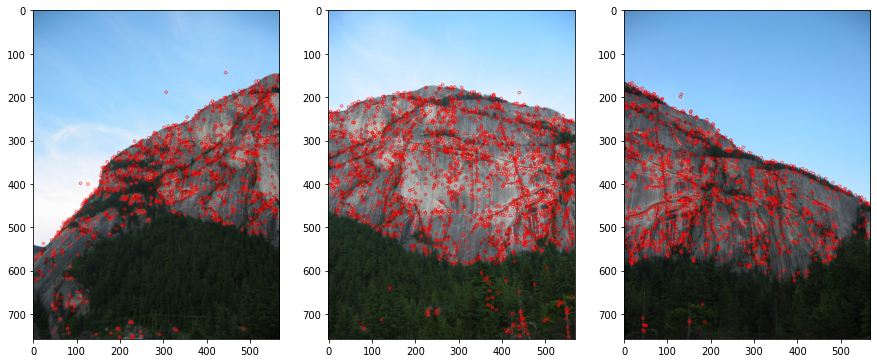

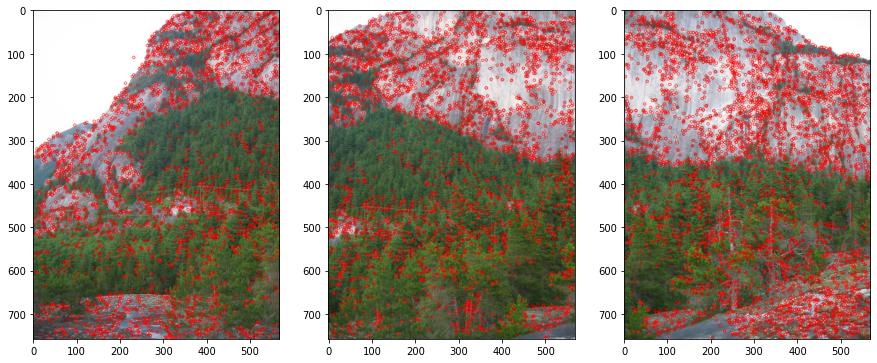

In [4]:
plt.figure(figsize = (15,15))
plt.subplot(1, 3, 1)
plt.imshow(cv.drawKeypoints(img1, keypoints_img1,outImage = None, color=(255,0,0)))
plt.subplot(1, 3, 2)
plt.imshow(cv.drawKeypoints(img2, keypoints_img2,outImage = None, color=(255,0,0)))
plt.subplot(1, 3, 3)
plt.imshow(cv.drawKeypoints(img3, keypoints_img3,outImage = None, color=(255,0,0)))

plt.figure(figsize = (15,15))
plt.subplot(2, 3, 1)
plt.imshow(cv.drawKeypoints(img4, keypoints_img4,outImage = None, color=(255,0,0)))
plt.subplot(2, 3, 2)
plt.imshow(cv.drawKeypoints(img5, keypoints_img5,outImage = None, color=(255,0,0)))
plt.subplot(2, 3, 3)
plt.imshow(cv.drawKeypoints(img6, keypoints_img6,outImage = None, color=(255,0,0)))

### Βήμα 2 : Διαδικασία ταιριάσματος χαρακτηριστικών μεταξύ δύο εικόνων

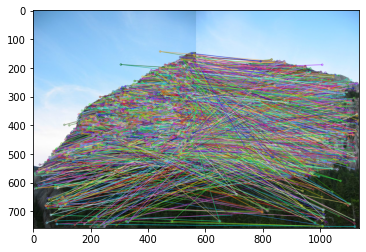

In [5]:
FLANN_INDEX_KDTREE = 0
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks=50)
flann = cv.FlannBasedMatcher(index_params,search_params)

des1 = np.float32(descriptors_img1)
des2 = np.float32(descriptors_img2)

matches = flann.knnMatch(des1,des2,k=2)

out = cv.drawMatchesKnn(img1, keypoints_img1, img2, keypoints_img2, matches, None, flags = 2)
plt.imshow(out)

### Βήμα 3 : Διατήρηση μόνο των πιο έγκυρων αντιστοιχίσεων μέσω εφαρμογής του κριτηρίου Lowe

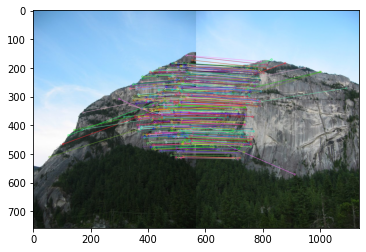

In [9]:
good_points = []
good_without_list = []

for m,n in matches:
    if m.distance/n.distance < 0.75:
        good_points.append([m])
        good_without_list.append(m)
out = cv.drawMatchesKnn(img1, keypoints_img1, img2, keypoints_img2, good_points, None, flags = 2)
plt.imshow(out)

### Βήμα 4 : Υπολογισμός ομογραφίας με RANSAC

In [10]:
query_pts = np.float32([keypoints_img1[m.queryIdx].pt for m in good_without_list]).reshape(-1, 1, 2) 
 
train_pts = np.float32([keypoints_img2[m.trainIdx].pt for m in good_without_list]).reshape(-1, 1, 2) 
 
H_matrix, mask = cv.findHomography(query_pts, train_pts, cv.RANSAC, 5.0) 

print(H_matrix)

[[ 1.23388399e+00 -2.16563160e-01 -3.49970343e+02]
 [ 3.77105706e-01  1.16075586e+00 -1.63786400e+02]
 [ 4.48895277e-04 -4.08171091e-05  1.00000000e+00]]


### Βήμα 5: Υπολογισμός μετασχηματισμένης εικόνας μέσω εφαρμογής Inverse warping

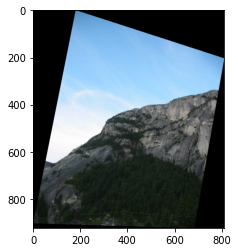

In [11]:
def projectionImage(H, img1):
    h,w,d = img1.shape

    corner_pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    transformed_corner_points = cv.perspectiveTransform(corner_pts, H)

    max_height = np.max(transformed_corner_points[:,0,1])
    min_height = np.min(transformed_corner_points[:,0,1])
    warped_height = int(np.ceil(max_height - min_height))       #  Βρίσκουμε τα απαιτούμενα dimensions για την νέα εικόνα

    max_width = np.max(transformed_corner_points[:,0,0])
    min_width = np.min(transformed_corner_points[:,0,0])
    warped_width = int(np.ceil(max_width - min_width))

    new_topleft_coords = np.array([min_height, min_width])       # Η πάνω-αριστερά γωνία, σε σχέση με το προηγούμενο σύστημα καρτεσιανών συντεταγμένων
    img1_warped = np.zeros((warped_height, warped_width, 3), dtype=np.uint16)   #initialization τελικής εικόνας
    
    # Για το inverse warping, παίρνουμε τα σημεία της τελικής εικόνας img1_warped, και τα παιρνάμε από την PerspectiveTransform
    xy_index = np.where(np.ones((img1_warped.shape[0], img1_warped.shape[1])))
    transformed_points = np.vstack( [xy_index[1], xy_index[0]] ).T
    transformed_points = transformed_points.reshape((transformed_points.shape[0], 1, transformed_points.shape[1]))
    
    # Τα initial_points είναι τα σημεία, αφού τους κάνουμε τον μετασσχηματισμό με τον αντίστροφο H
    initial_points = cv.perspectiveTransform((transformed_points + np.array([min_width, min_height])).astype(np.float32), np.linalg.inv(H))
    
    # Ελέγχουμε να πάρουμε τα σημεία που είναι μέσα στην εικόνα
    condition_1 = initial_points[:,:,0]>=0
    condition_2 = initial_points[:,:,0]<img1.shape[1]
    condition_3 = initial_points[:,:,1]>=0
    condition_4 = initial_points[:,:,1]<img1.shape[0]
    
    condition_table = condition_1 & condition_2 & condition_3 & condition_4
    indices_to_pixels = (condition_table.nonzero())[0]
    
    x_transformed = transformed_points[indices_to_pixels, :, 0]
    y_transformed = transformed_points[indices_to_pixels, :, 1]
    x_initial = initial_points[indices_to_pixels, :, 1]
    y_initial = initial_points[indices_to_pixels, :, 0]
    
    # Και παίρνουμε με np.floor, την τιμή του pixel που βρίσκεται στην αρχική εικόνα πριν το warping
    img1_warped[y_transformed, x_transformed] = img1[np.floor(x_initial).astype(int), np.floor(y_initial).astype(int)]

    return img1_warped, new_topleft_coords

img1_warped, new_topleft_coords = projectionImage(H_matrix,img1)
plt.imshow(img1_warped)

### Βήμα 6:  Συνένωση των εικόνων

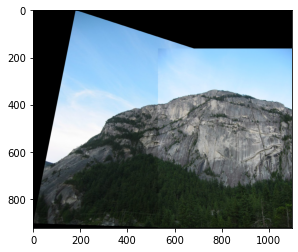

In [12]:
def mergeWarpedImages(img1_warped, img2, img1_topleft_coords):
    min_height = min(0, (img1_topleft_coords[0]))
    max_height = max(img2.shape[0], img1_warped.shape[0]+img1_topleft_coords[0])
    min_width = min(0, int(img1_topleft_coords[1]))
    max_width = max(img2.shape[1], img1_warped.shape[1]+img1_topleft_coords[1])
    
    # Υπολογίζουμε τις διαστάσεις της τελική εικόνας
    final_height = int(np.ceil(max_height - min_height))
    final_width = int(np.ceil(max_width - min_width))
    final_img = np.zeros((final_height, final_width, 3), dtype=np.uint8)
    
    new_top_left_coord = np.empty((2,), dtype = float)
    
    if img1_topleft_coords[0] < 0:
        new_top_left_coord[0] = 0
    else:
        new_top_left_coord[0] = img1_topleft_coords[0]
        
    if img1_topleft_coords[1] < 0:
        new_top_left_coord[1] = 0
    else:
        new_top_left_coord[1] = img1_topleft_coords[1]
    
    # Βάζουμε πρώτα την warped εικόνα πάνω στο κατάλληλο τμήμσ του τελικού κανβά
    img1_offset_h = int(np.floor(new_top_left_coord[0]))
    img1_offset_w = int(np.floor(new_top_left_coord[1]))
    final_img[img1_offset_h:img1_offset_h+img1_warped.shape[0], img1_offset_w:img1_offset_w+img1_warped.shape[1], :] = img1_warped
    
    # Και μετά βάζουμε την δεύτερη εικόνα στο δικό της τμήμα (θα επικαλύπτει μέρος του img1_warped)
    img2_offset_h = int(np.floor(new_top_left_coord[0] - img1_topleft_coords[0]))
    img2_offset_w = int(np.floor(new_top_left_coord[1] - img1_topleft_coords[1]))
    final_img[img2_offset_h:img2_offset_h+img2.shape[0], img2_offset_w:img2_offset_w+img2.shape[1], :] = img2
    
    return final_img

final_img = mergeWarpedImages(img1_warped, img2, new_topleft_coords)
plt.imshow(final_img)

#### Τελική Συνάρτηση

In [13]:
# Μαζεύουμε όλες τις παραπάνω τεχνικές σε μία συνάρτηση

def stitchImages(img1, img2):
    sift = cv.xfeatures2d.SIFT_create()
    [keypoints_img1,descriptors_img1] = sift.detectAndCompute(img1,None)
    [keypoints_img2,descriptors_img2] = sift.detectAndCompute(img2,None)
    
    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict()
    flann = cv.FlannBasedMatcher(index_params,search_params)

    des1 = np.float32(descriptors_img1)
    des2 = np.float32(descriptors_img2)

    matches = flann.knnMatch(des1,des2,k=2)
    
    good_without_list = []
    for m,n in matches:
        if m.distance/n.distance < 0.75:
            good_without_list.append(m)
            
    query_pts = np.float32([keypoints_img1[m.queryIdx].pt for m in good_without_list]).reshape(-1, 1, 2) 
    train_pts = np.float32([keypoints_img2[m.trainIdx].pt for m in good_without_list]).reshape(-1, 1, 2) 
    H_matrix, mask = cv.findHomography(query_pts, train_pts, cv.RANSAC, 5.0) 
    
    img1_warped, new_topleft_coords = projectionImage(H_matrix, img1)
    
    stitched_img = mergeWarpedImages(img1_warped, img2, new_topleft_coords)

    zero_rows = np.unique(np.where( (stitched_img == np.array([0,0,0])).all(axis=1))[0])
    stitched_img = np.delete(stitched_img, zero_rows, axis=0)
    zero_cols = np.unique(np.where( (stitched_img == np.array([0,0,0])).all(axis=0))[0])
    stitched_img = np.delete(stitched_img, zero_cols, axis=1)
    
    return stitched_img

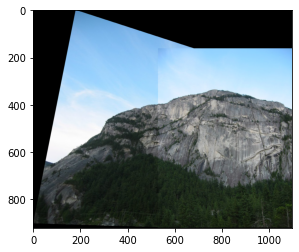

In [16]:
temp1 = stitchImages(img1, img2)
plt.imshow(temp1)

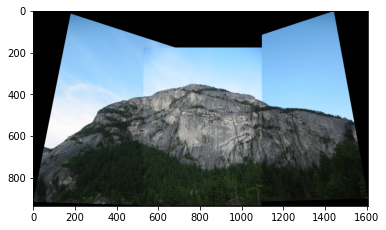

In [17]:
temp2 = stitchImages(img3, temp1)
plt.imshow(temp2)

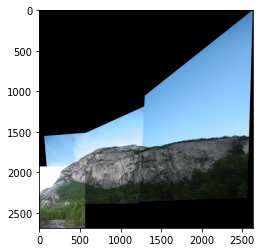

In [18]:
temp3 = stitchImages(temp2, img4)
plt.imshow(temp3)

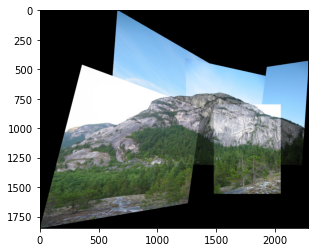

In [19]:
temp4 = stitchImages(temp3, img6)
plt.imshow(temp4)

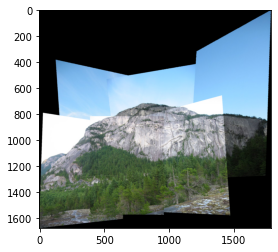

In [20]:
temp5 = stitchImages(temp4, img5)
plt.imshow(temp5)